# HLCA Figure 3, Extended Data Figure 2-6

In this notebook we'll generate the figures from figure 3 of the HLCA preprint, plus corresponding extended figures (2-6).

### Import modules, set paths, load files:

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
from scipy.stats import entropy
from collections import Counter

sys.path.append("../../scripts/")
import reference_based_harmonizing
import sankey

for pretty code formatting (not needed to run code):

In [2]:
%load_ext lab_black

set figure parameters:

In [3]:
sc.set_figure_params(dpi=140, figsize=(8, 8))

set paths:

In [4]:
path_HLCA = "../../data/HLCA_core_h5ads/HLCA_v1.h5ad"
path_celltype_anns_ordered = "../../supporting_files/celltype_structure_and_colors/manual_anns_and_leveled_anns_ordered.csv"  # contains (ordered) final annotations and matching colors
path_marker_genes = "../../results/DEAs/manann_top10markergenes.csv"
dir_HLCA_subsets = "../../data/HLCA_core_h5ads/HLCA_v1_subsets/"
dir_figures = "./figures/"

Load files:

In [5]:
adata = sc.read(path_HLCA)  # HLCA
marker_genes = pd.read_csv(path_marker_genes, index_col=0)
ct_df = pd.read_csv(path_celltype_anns_ordered, index_col=0)  # cell type info
cts = ct_df.index.tolist()  # get biological order of cts

initiate empty dictionary for figures:

In [6]:
FIGURES = dict()

## Generate figures:

### 3a HLCA umap, level 1 annotations:

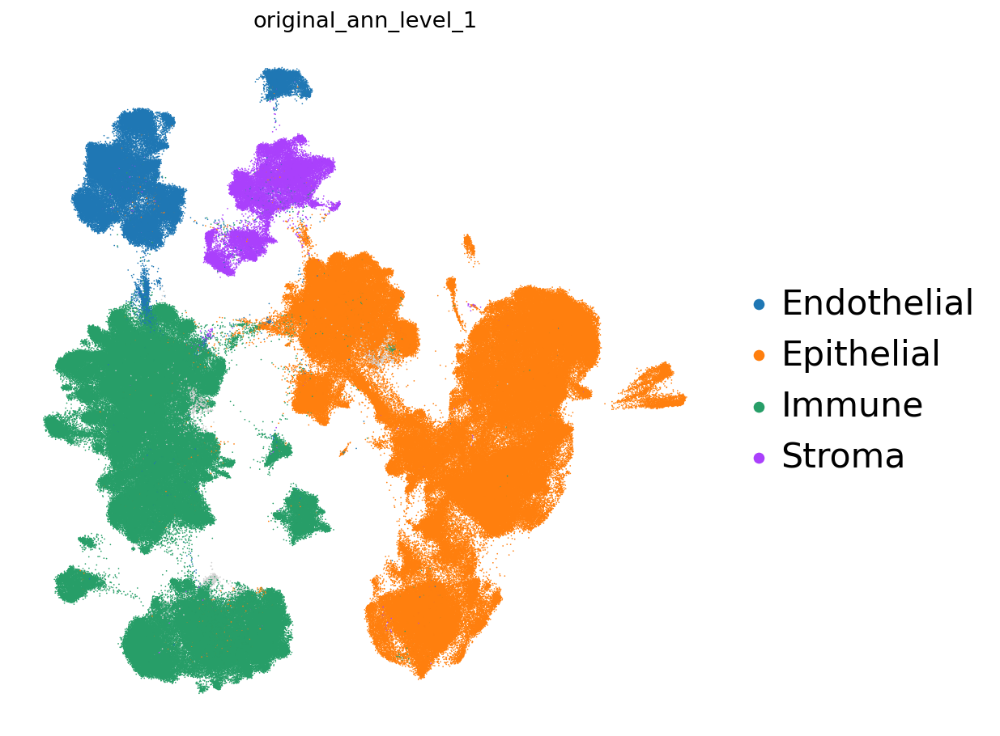

In [7]:
FIGURES["3a_atlas_umap_ann_level_1"] = sc.pl.umap(
    adata,
    color="original_ann_level_1",
    groups=["Epithelial", "Endothelial", "Immune", "Stroma"],
    frameon=False,
    #     title=,
    return_fig=True,
    na_in_legend=False,
    size=3,
    #     legend_loc="on data",
    legend_fontsize=22,
    sort_order=False,
)

### 3b + 3d, extended data fig. 2, label + subject entropy and manual re-annotations:

First generate umaps that specify which part of the HLCA we're subsetting to (they're shown in the top left corners of the large umaps in figure 3b):

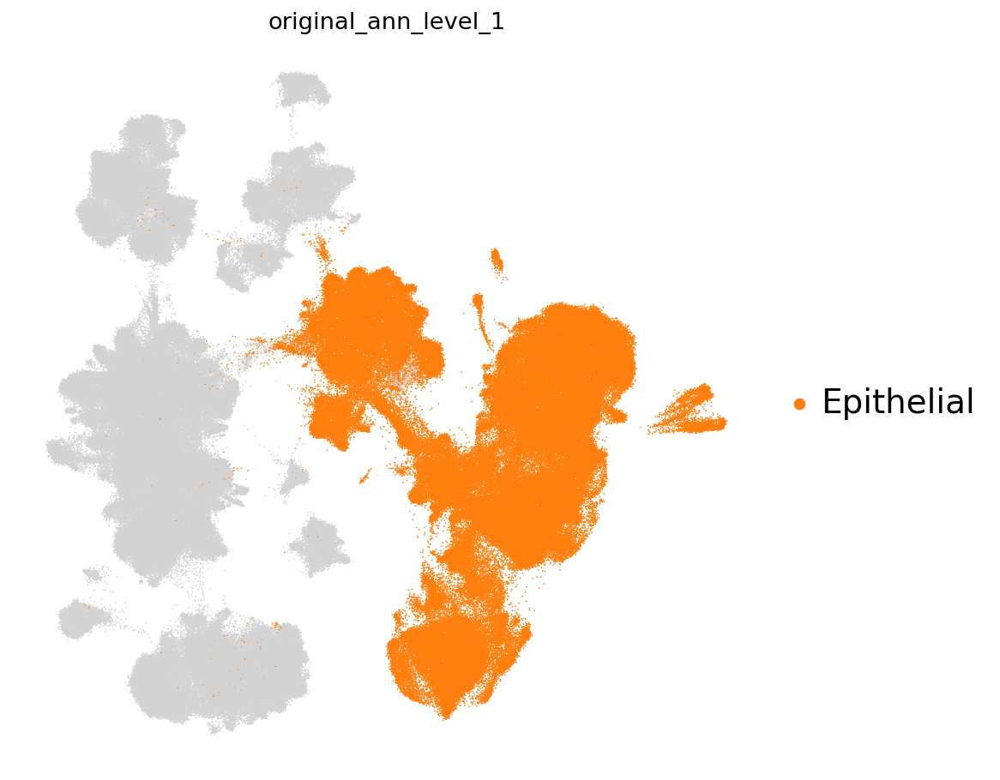

In [8]:
FIGURES["3b_epithelial_subsetting"] = sc.pl.umap(
    adata,
    color="original_ann_level_1",
    groups=["Epithelial"],
    frameon=False,
    return_fig=True,
    na_in_legend=False,
    legend_fontsize=20,
    size=3,
    sort_order=False,
)

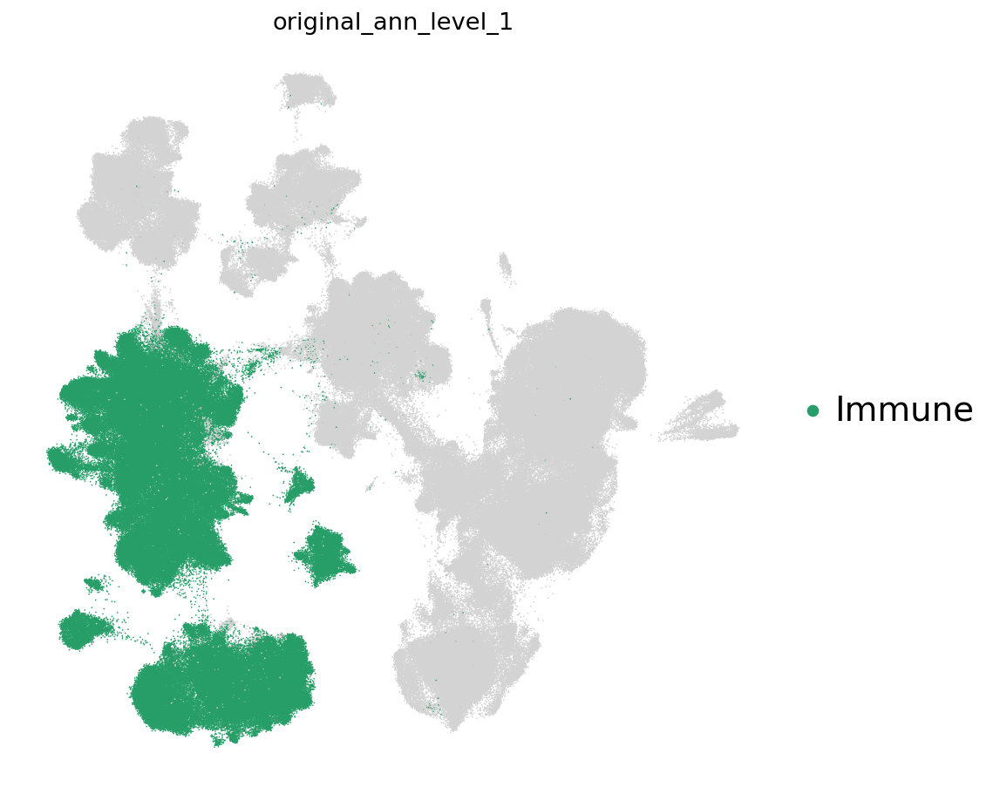

In [9]:
FIGURES["3b_immune_subsetting"] = sc.pl.umap(
    adata,
    color="original_ann_level_1",
    groups=["Immune"],
    frameon=False,
    return_fig=True,
    na_in_legend=False,
    legend_fontsize=20,
    size=3,
    sort_order=False,
)

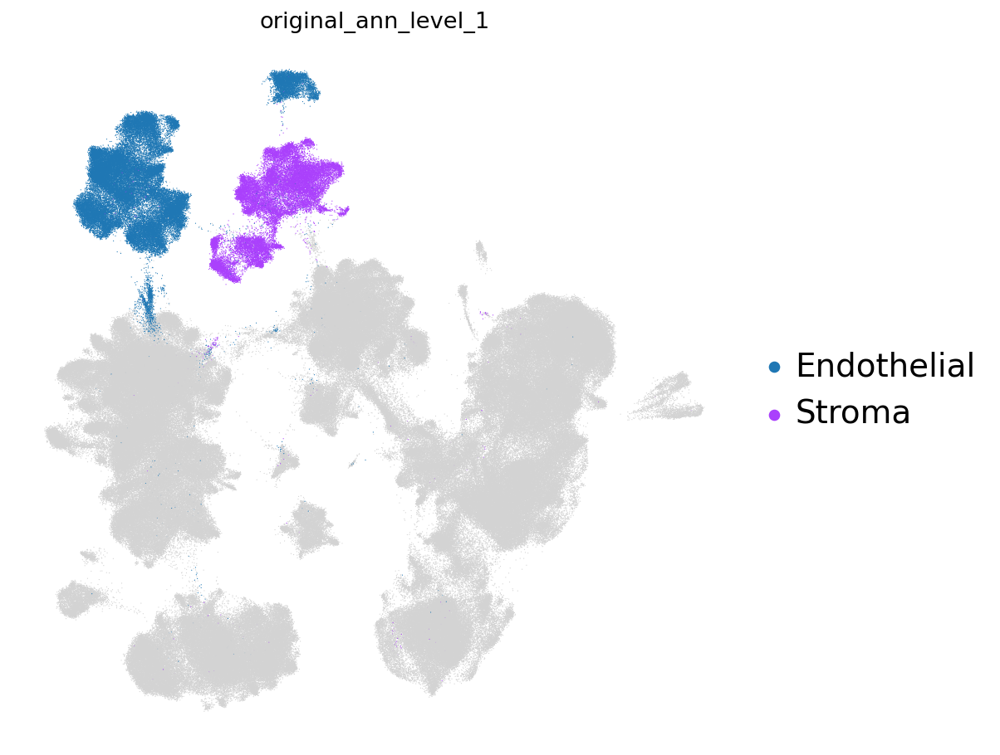

In [10]:
FIGURES["3b_endothelial_stromal_subsetting"] = sc.pl.umap(
    adata,
    color="original_ann_level_1",
    groups=["Endothelial", "Stroma"],
    frameon=False,
    return_fig=True,
    na_in_legend=False,
    legend_fontsize=20,
    size=1.5,
    sort_order=False,
)

Import atlas split into 3 subsets for figures (epithelial, immune, and endothelial + stromal). These objects also contain pre-computed umaps etc., which would take quite some time to re-compute.

In [11]:
subadatas = dict()
subadatas["epi"] = sc.read_h5ad(os.path.join(dir_HLCA_subsets, "HLCA_epithelial.h5ad"))
subadatas["imm"] = sc.read_h5ad(os.path.join(dir_HLCA_subsets, "HLCA_immune.h5ad"))
subadatas["str_end"] = sc.read_h5ad(
    os.path.join(dir_HLCA_subsets, "HLCA_endothelial_and_stromal.h5ad")
)

For each subset, plot label entropy per cluster, subject entropy per cluster, and final annotations (different font sizes etc. for generation of paper figure):

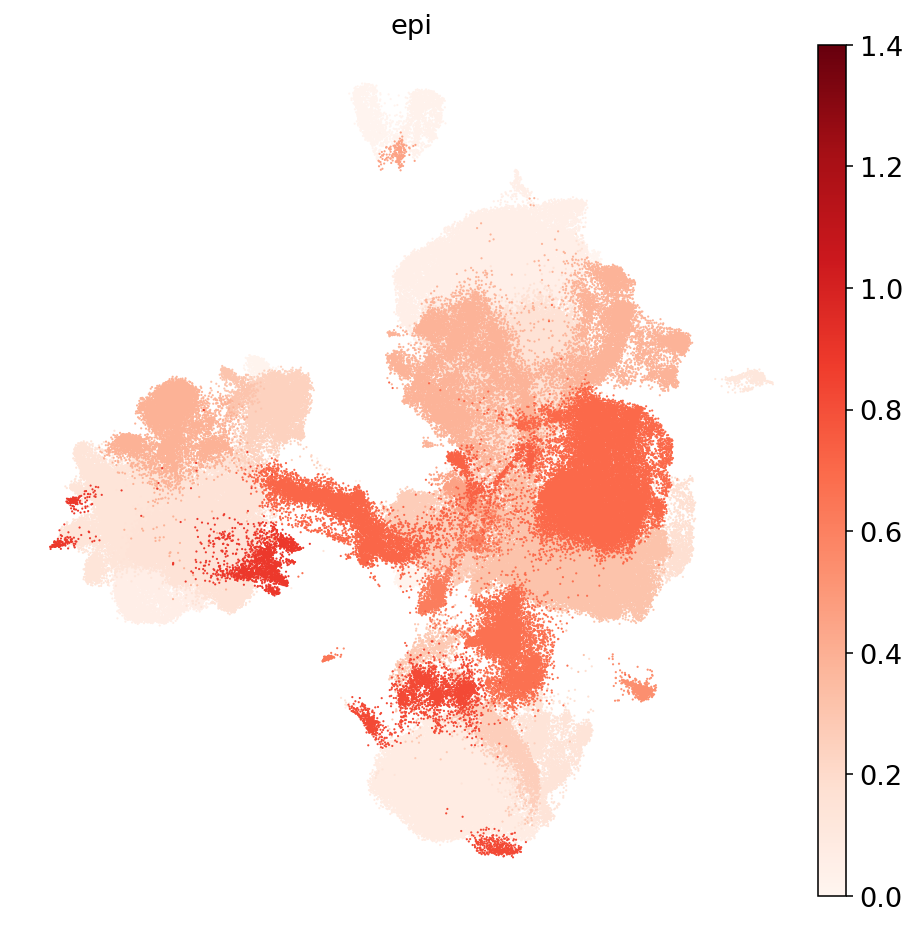

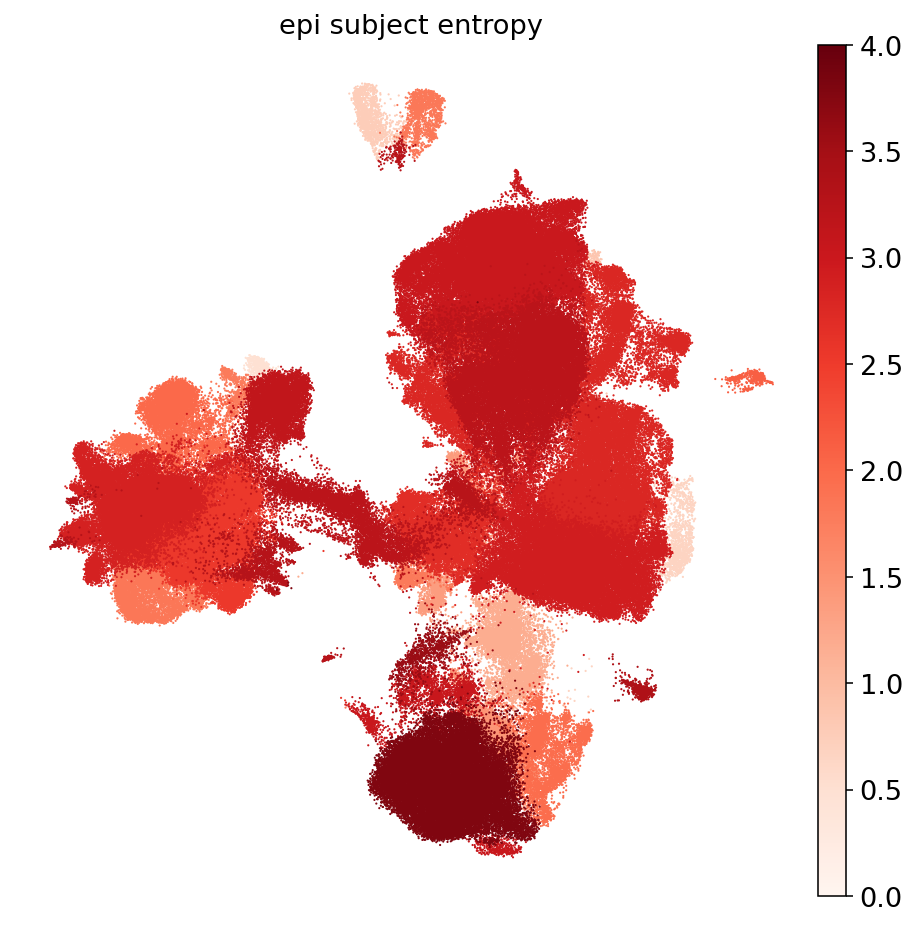

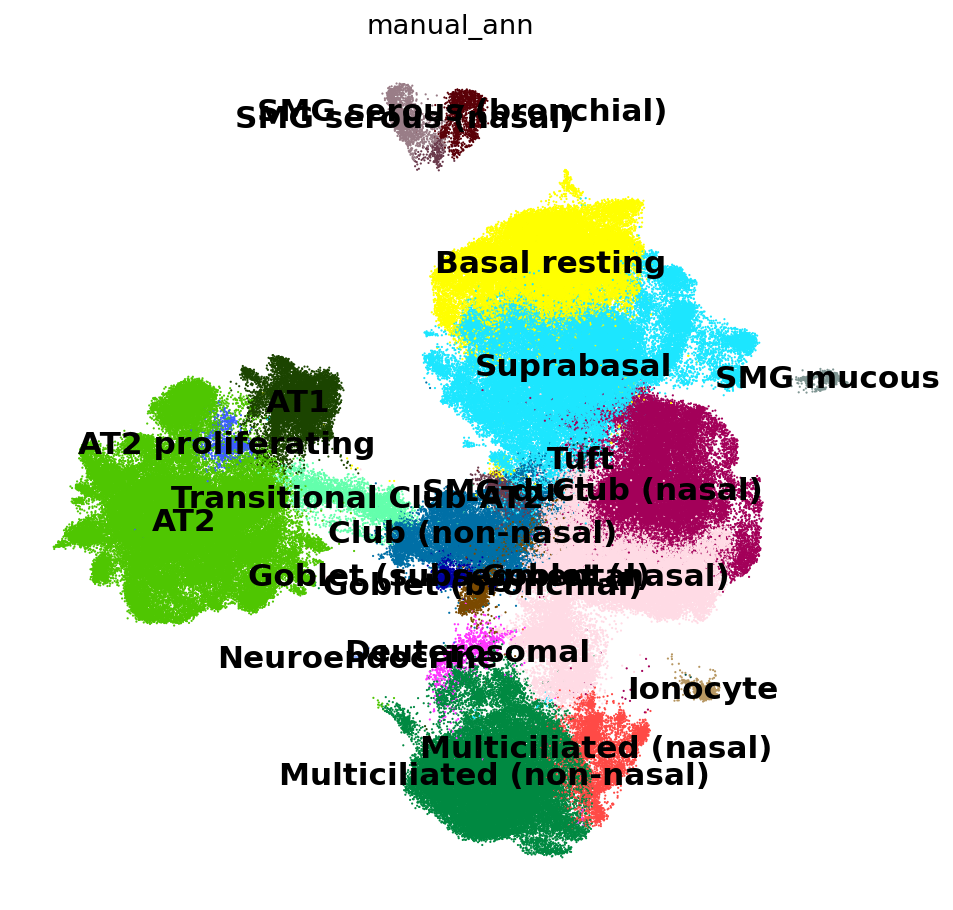

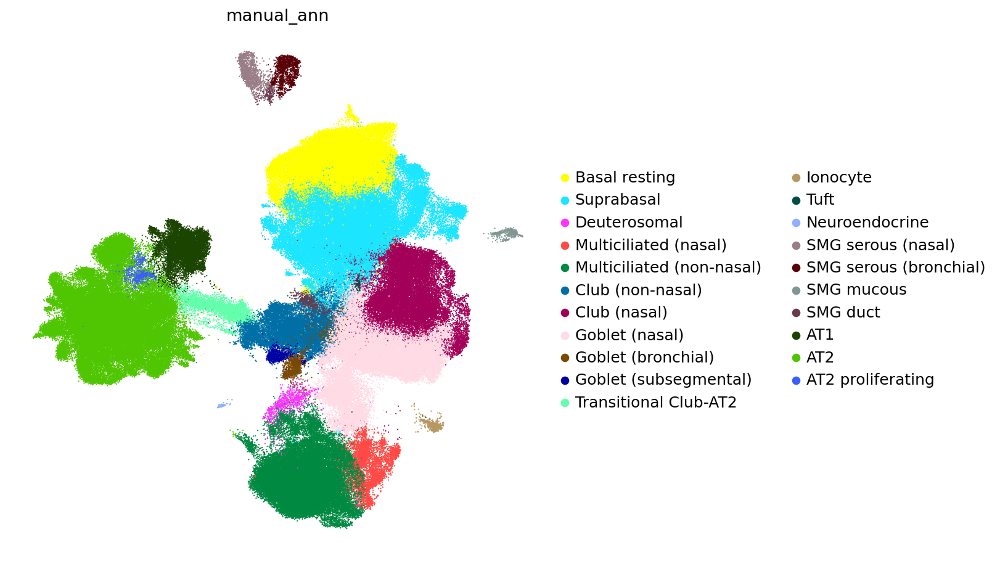

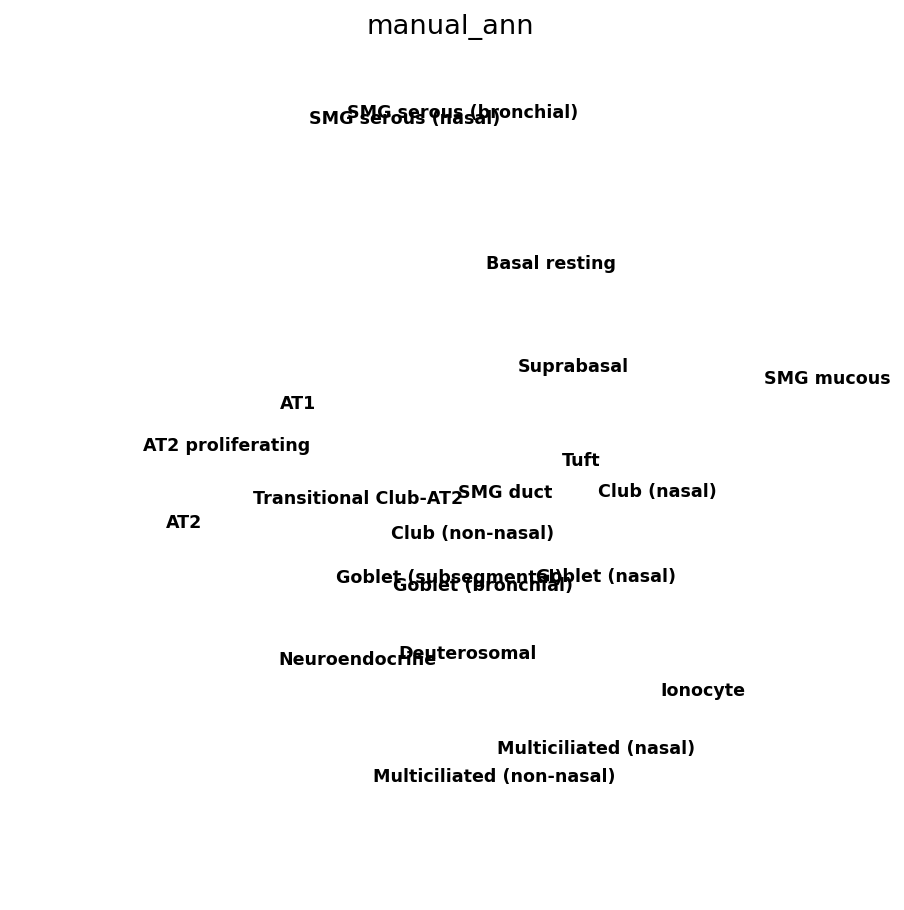

...

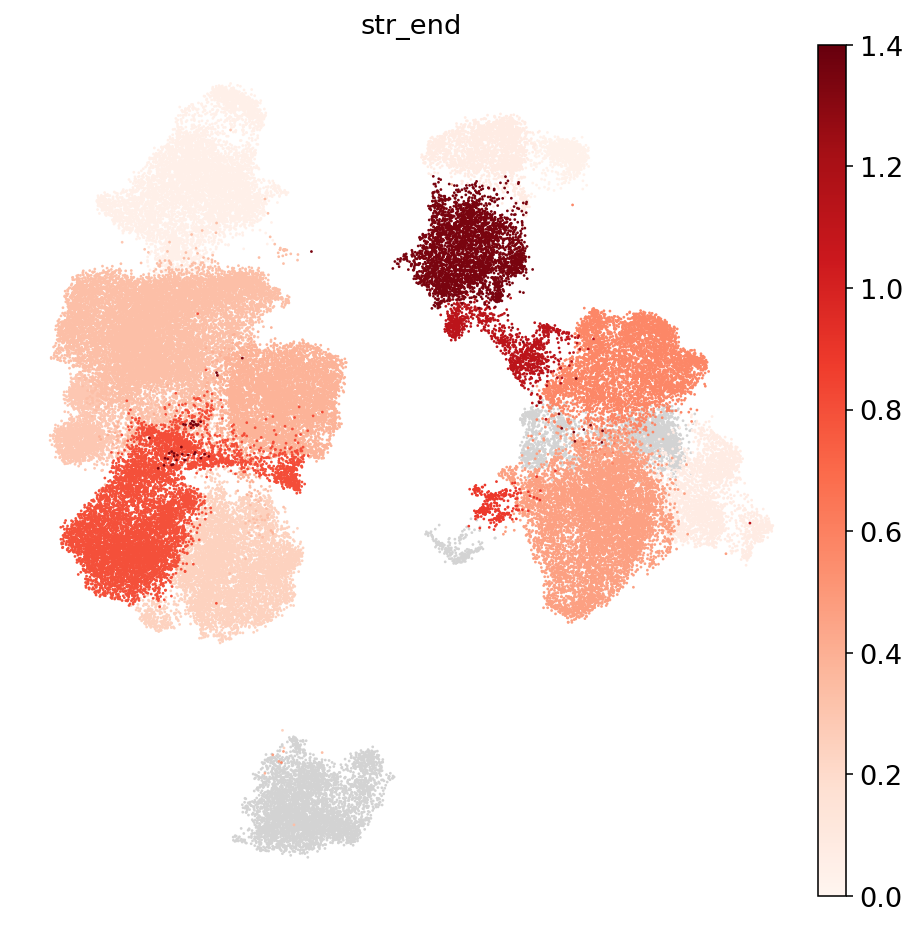

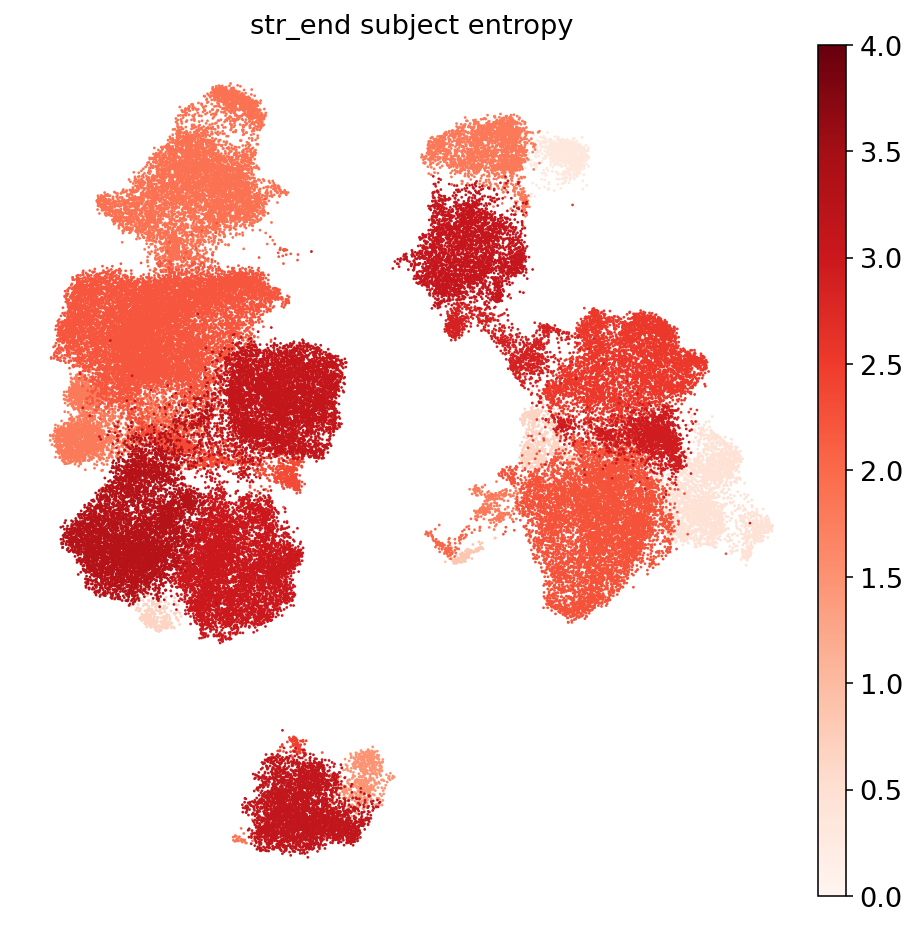

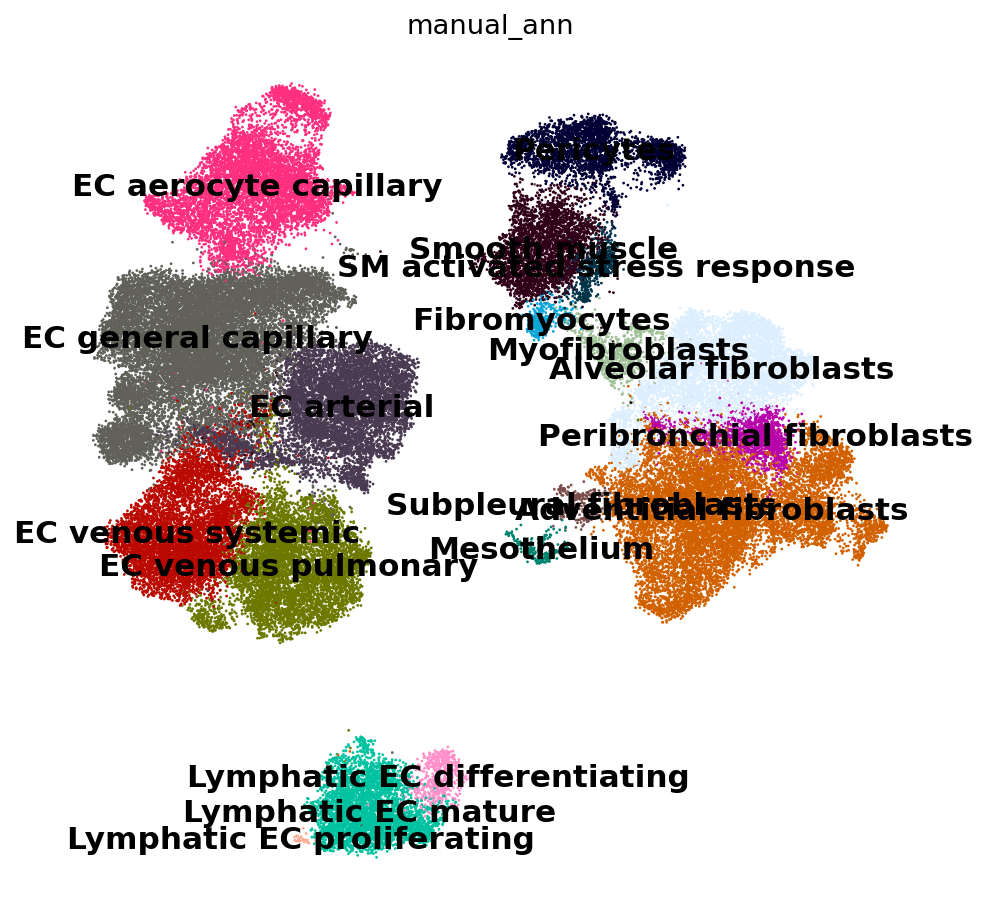

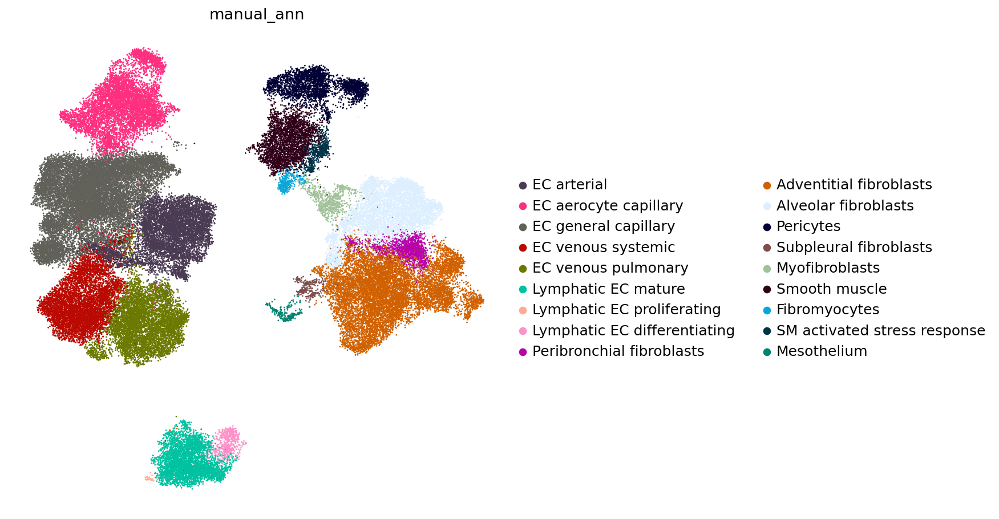

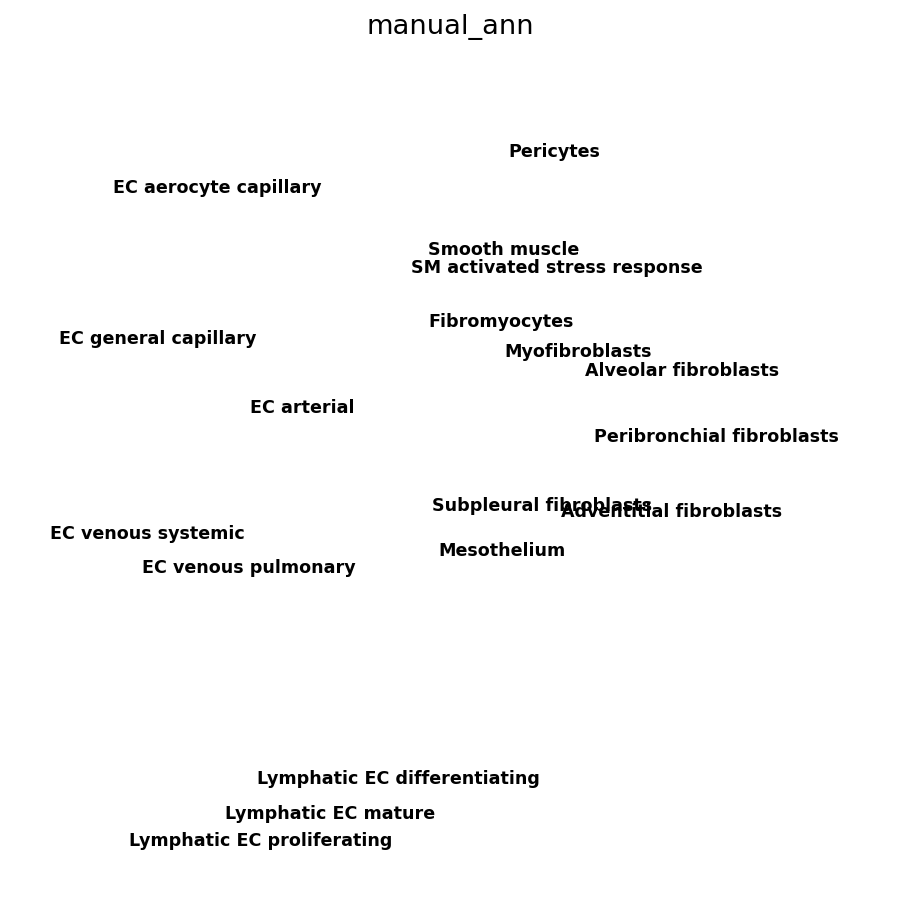

In [12]:
for subcomp, subadata in subadatas.items():
    if subcomp == "epi":
        dotsize = 5
    elif subcomp == "imm":
        dotsize = 6.5
    elif subcomp == "str_end":
        dotsize = 8
    FIGURES[f"3b_{subcomp}_umap_label_entropy"] = sc.pl.umap(
        subadata,
        color="entropy_original_ann_level_3_clean_leiden_3",
        frameon=False,
        cmap="Reds",
        vmin=0,
        vmax=1.4,
        title=subcomp,
        return_fig=True,
        size=dotsize,
    )
    FIGURES[f"ED2_{subcomp}_umap_subj_entropy"] = sc.pl.umap(
        subadata,
        color="entropy_subject_ID_leiden_3",
        frameon=False,
        cmap="Reds",
        vmin=0,
        vmax=4,
        title=f"{subcomp} subject entropy",
        return_fig=True,
        size=dotsize,
    )
    FIGURES[f"3d_{subcomp}_umap_annotations_labels_on_top"] = sc.pl.umap(
        subadata,
        color="manual_ann",
        frameon=False,
        return_fig=True,
        legend_loc="on data",
        legend_fontsize=16,
        size=dotsize,
    )
    FIGURES[f"3d_{subcomp}_umap_annotations_labels_on_side"] = sc.pl.umap(
        subadata, color="manual_ann", frameon=False, return_fig=True, size=dotsize
    )
    FIGURES[f"3d_{subcomp}_umap_annotations_labels_only"] = sc.pl.umap(
        subadata,
        color="manual_ann",
        frameon=False,
        legend_loc="on data",
        legend_fontsize=9,
        size=0,
        return_fig=True,
    )

In the paper, we distinguish between high and low label and subject entropy. We chose those cutoffs as sensibly as possible using the code below:

Calculate cluster statistics (e.g. number of subjects per cluster, subject and label entropy per cluster, the final annotation of the cluster, number of cells per cluster):

In [13]:
cl_subj_df = adata.obs.groupby("leiden_3").agg(
    {
        "subject_ID": "nunique",
        "entropy_subject_ID_leiden_3": "first",
        "entropy_original_ann_level_3_clean_leiden_3": "first",
        "ann_level_1": "first",
        "ann_level_3": "first",
        "leiden_3": "count",
    }
)
cl_subj_df.rename(columns={"leiden_3": "ncells"}, inplace=True)

Check total number of subjects, level 3 original annotations, and leiden_3 clusters:

In [14]:
nsubjects = adata.obs.subject_ID.nunique()
nlev3anns = adata.obs.original_ann_level_3_clean.nunique()
nclusters = adata.obs.leiden_3.nunique()

In [15]:
print(
    f"Number of subjects: {nsubjects}\nNumber of unique original level 3 annotations (after harmonization): {nlev3anns}\nNumber of clusters: {nclusters}"
)

Number of subjects: 107
Number of unique original level 3 annotations (after harmonization): 30
Number of clusters: 93


We'll set the threshold for low entropy using the following example case: 95% of cells coming from one subject, while the rest is equally divided over the other subjects. Other distributions resulting in the same or a lower entropy value will be considered to have low subject entropy.

In [16]:
p_subj = [0.95] + [0.05 / (nsubjects - 1)] * (nsubjects - 1)
subj_entr_cutoff = entropy(p_subj)
print(subj_entr_cutoff)

0.4316871980514762


Based on this threshold, we can calculate the number of clutsers with high subject entropy:

In [17]:
print(
    "Number of clusters with high subject entropy:",
    (cl_subj_df.entropy_subject_ID_leiden_3 > subj_entr_cutoff).sum(),
)

Number of clusters with high subject entropy: 79


Check the final level 1 and level 3 annotations of these clusters:

In [18]:
cl_subj_df.loc[
    cl_subj_df.entropy_subject_ID_leiden_3 < subj_entr_cutoff,
    ["ann_level_1", "ann_level_3"],
]

,ann_level_1,ann_level_3
leiden_3,,
1.4.2,Immune,Mast cells
1.4.3,Immune,Mast cells
1.6.0,Immune,Macrophages
1.6.1,Immune,Macrophages
1.6.2,Immune,Macrophages
1.6.3,Immune,Macrophages
1.2.5,Immune,Macrophages
1.0.4,Immune,Macrophages
1.0.6,Immune,Macrophages


Now we will determine the same type of threshold for cell-type label entropy. We'll consider label/annotation entropy low when 3/4 of the cluster has one label, while the rest has one other label (or other distributions resulting in the same or a lower entropy value)

In [19]:
p_ann = [0.75] + [0.25]  # / (nlev3anns - 1)] * (nlev3anns - 1)
ann_entr_cutoff = entropy(p_ann)
print(ann_entr_cutoff)

0.5623351446188083


Based on this threshold, we can check the number of clusters that have low label entropy:

In [20]:
print(
    "Number of clusters with low label entropy:",
    (cl_subj_df.entropy_original_ann_level_3_clean_leiden_3 < ann_entr_cutoff).sum(),
)

Number of clusters with low label entropy: 61


Some more summary stats:

In [21]:
print("Median number of subjects per cluster:", cl_subj_df.subject_ID.median())
print("Min:", cl_subj_df.subject_ID.min(), "Max:", cl_subj_df.subject_ID.max())

Median number of subjects per cluster: 47.0
Min: 2 Max: 102


## 3c: Re-annotation of cluster with high cell-type label entropy:

Here we will focus on cluster 1.2.1, the immune cluster with highest cell-type label entropy, and show how it was originally labeled versus how it was finally re-annotated.

Subset to cluster, set all cell type that are not DCs, monocytes or macrophages at level 3 to "other" to prevent over-crowding of the plot.

In [22]:
adata_121 = adata[adata.obs.leiden_3.values == "1.2.1", :].copy()
al3_to_filt = dict(
    zip(
        adata_121.obs.original_ann_level_3_clean.unique(),
        len(adata_121.obs.original_ann_level_3_clean.unique()) * ["Other"],
    )
)
for ct_to_keep in ["Dendritic cells", "Monocytes", "Macrophages"]:
    al3_to_filt[ct_to_keep] = ct_to_keep
adata_121.obs[
    "original_ann_level_3_clean_filt"
] = adata_121.obs.original_ann_level_3_clean.map(al3_to_filt)

Plot sankey plot showing original labels versus final annotations for this cluster:

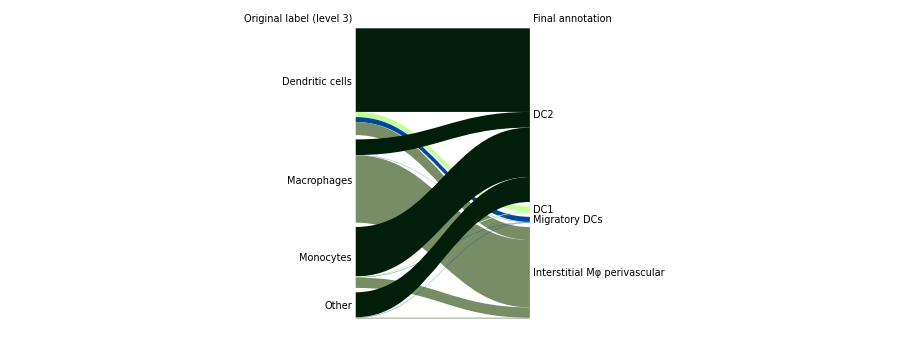

In [23]:
original_anns = adata_121.obs.loc[:, "original_ann_level_3_clean_filt"]
final_anns = adata_121.obs.loc[:, "manual_ann"]
colormapping = {ct: ct_df.loc[ct, "colors"] for ct in final_anns.unique()}
fig, ax = plt.subplots(figsize=(8, 3))
sankey.sankey(
    x=original_anns,
    y=final_anns,
    title="",
    title_left="Original label (level 3)",
    title_right="Final annotation",
    ax=ax,
    fontsize="5",
    colors=colormapping,
    colorside="right",
    alpha=1,
)
FIGURES["3c_high_label_entropy_cluster_reannotation_cl121_sankey"] = fig
plt.show()
plt.close()

### Extended data figure 3: marker expression of DC2s from figure 3c (above)

We will show marker expression of all cells with final annotation DC2. As many of these cells were originally labeled as macrophages and monocytes, we will also add cells finally annotated as monocytes and macrophages (from any cluster) for comparison. 

We include DC2, monoyte and macrophage markers:

In [24]:
markers = [
    "CD1C",
    "CLEC10A",
    "FCER1A",
    "FCN1",
    "S100A12",
    "CD300E",
    "MARCO",
    "APOE",
    "GPNMB",
]

Store barcodes of monocytes, macrophages, and DC2s:

In [25]:
monocytes = adata.obs.index[adata.obs.ann_level_3 == "Monocytes"].tolist()
macrophages = adata.obs.index[adata.obs.ann_level_3 == "Macrophages"].tolist()
DC2s = adata.obs.index[adata.obs.ann_level_4 == "DC2"].tolist()

split DC2s based on original label:

In [26]:
DC2s_l_DC = adata.obs.index[
    [
        x and y
        for x, y in zip(
            adata.obs.ann_level_4 == "DC2",
            adata.obs.original_ann_level_3 == "Dendritic cells",
        )
    ]
].tolist()
DC2s_l_mono = adata.obs.index[
    [
        x and y
        for x, y in zip(
            adata.obs.ann_level_4 == "DC2",
            adata.obs.original_ann_level_3 == "Monocytes",
        )
    ]
].tolist()
DC2s_l_macro = adata.obs.index[
    [
        x and y
        for x, y in zip(
            adata.obs.ann_level_4 == "DC2",
            adata.obs.original_ann_level_3 == "Macrophages",
        )
    ]
].tolist()
DC2s_l_other = adata.obs.index[
    [
        x and y
        for x, y in zip(
            adata.obs.ann_level_4 == "DC2",
            ~adata.obs.original_ann_level_3.isin(
                ["Monocytes", "Dendritic cells", "Macrophages"]
            ),
        )
    ]
].tolist()

Check that we have all DC2s now:

In [27]:
len(DC2s_l_DC) + len(DC2s_l_mono) + len(DC2s_l_macro) + len(DC2s_l_other) == len(DC2s)

True

Create anndata object with our 3 cell types of interest:

In [28]:
adata_myeloid = adata[monocytes + macrophages + DC2s, markers].copy()

Create custom labels, combining level 3 and 4 annotations, and specifying original level 3 labels for DC2s:

In [29]:
# custom label
adata_myeloid.obs["Myeloid_custom_label"] = None
adata_myeloid.obs.loc[monocytes, "Myeloid_custom_label"] = "Monocytes"
adata_myeloid.obs.loc[macrophages, "Myeloid_custom_label"] = "Macrophages"
adata_myeloid.obs.loc[DC2s_l_DC, "Myeloid_custom_label"] = "DC2 (original label: DC)"
adata_myeloid.obs.loc[
    DC2s_l_mono, "Myeloid_custom_label"
] = "DC2 (original label: Monocytes)"
adata_myeloid.obs.loc[
    DC2s_l_macro, "Myeloid_custom_label"
] = "DC2 (original label: Macrophages)"
adata_myeloid.obs.loc[
    DC2s_l_other, "Myeloid_custom_label"
] = "DC2 (original label other)"

Normalize myeloid data so that all genes are on the same scale, with the 99th expression percentile among all cells from the 3 cell types is set to 1:

In [30]:
perc_99 = np.percentile(adata_myeloid.X.toarray(), 99, axis=0)
adata_myeloid.X = adata_myeloid.X / perc_99

Set fontsize for figure:

In [31]:
sc.set_figure_params(fontsize=12)

Convert adata to pandas dataframe for heatmap plotting. Calculate one mean value per subject-celtype pair:

In [32]:
myeloid_df = pd.DataFrame(
    adata_myeloid.X,
    index=adata_myeloid.obs.Myeloid_custom_label,
    columns=adata_myeloid.var.index,
)
myeloid_df["subject_ID"] = adata_myeloid.obs.subject_ID.values
myeloid_df_per_ct_per_subject = myeloid_df.groupby(
    ["Myeloid_custom_label", "subject_ID"]
).agg({gene: "mean" for gene in markers})
# remove rows with nans
myeloid_df_per_ct_per_subject.dropna(axis=0, inplace=True)

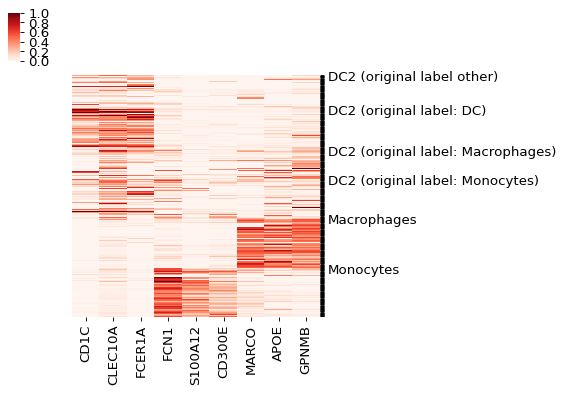

In [33]:
yticks = []
yticks_unfiltered = myeloid_df_per_ct_per_subject.index.get_level_values(
    level=0
).tolist()
for t in yticks_unfiltered:
    if t in yticks:
        yticks.append("")
    else:
        yticks.append(t)
fig_heatmap = sns.clustermap(
    figsize=(5, 5),
    data=myeloid_df_per_ct_per_subject.values,
    row_cluster=False,
    col_cluster=False,
    vmin=0,
    vmax=1,
    cmap="Reds",
    yticklabels=yticks,
    xticklabels=myeloid_df_per_ct_per_subject.columns,
)
FIGURES[f"ED3_DC2s_mono_macro_per_subject_heatmap"] = fig_heatmap
plt.show()
plt.close()

## 3e: Comparison of original labels to final annotations:

In this figure we indicate, for each final cell type annotation, to what extend it was originally correctly labeled, "under-labeled" (correct but at lower level of detail), or mis-labeled. The analysis for this was done in notebook 7: "7_manual_ann_ingestion_and_removal_of_doublets_etc".

In that notebook we distinguished between "underannotated, correct" and "underannotated, incorrect". We will now add the latter to "mislabeled" and rename the former ad "Underlabeled".

In [34]:
adata.obs["reannotation_type_summ"] = adata.obs.reannotation_type.map(
    {
        "misannotated": "Mislabeled",
        "underannotated, correct": "Underlabeled",
        "underannotated, incorrect": "Mislabeled",
        "correctly annotated": "Correctly labeled",
    }
)

Calculate the number of cells for each annotation type, for each final annotation ("manual_ann"), and convert to percentages:

In [35]:
annotation_types_per_manann = pd.crosstab(
    adata.obs.manual_ann, adata.obs.reannotation_type_summ
)
annotation_types_per_manann = (
    annotation_types_per_manann.div(annotation_types_per_manann.sum(axis=1), axis=0)
    * 100
)

Add row with overall numbers (i.e. numbers for all cells, not a single cell type):

In [36]:
overall_annotation_types = (
    adata.obs.reannotation_type_summ.value_counts() / adata.n_obs * 100
)

In [37]:
annotation_types_per_manann.index = annotation_types_per_manann.index.tolist()

In [38]:
annotation_types_per_manann.loc[
    "Overall", overall_annotation_types.index
] = overall_annotation_types.values

Plot barplot:

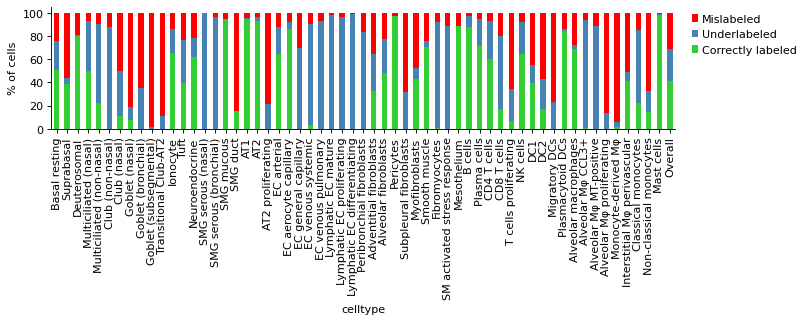

In [39]:
fz = 10
with plt.rc_context(
    {
        "figure.figsize": (10, 2),
        "xtick.labelsize": fz,
        "ytick.labelsize": fz,
        "axes.spines.right": False,
        "axes.spines.top": False,
    }
):
    ax = annotation_types_per_manann.loc[
        cts + ["Overall"], ["Correctly labeled", "Underlabeled", "Mislabeled"]
    ].plot(kind="bar", stacked=True, color=["limegreen", "steelblue", "red"])
    ax.tick_params(which="minor")
    plt.grid(False)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], loc=(1.02, 0.57), fontsize=fz, frameon=False)
    plt.ylabel("% of cells", fontsize=fz)
    plt.xlabel("celltype", fontsize=fz)
    plt.yticks(np.arange(0, 101, 20), fontsize=fz)
    FIGURES["3e_annotation_accuracy"] = ax.get_figure()
#     plt.show()

Some stats mentioned in the paper:

In [40]:
print(
    "Number of annotations with majority correctly labeled:",
    (annotation_types_per_manann["Correctly labeled"] > 50).sum(),
)

Number of annotations with majority correctly labeled: 19


In [41]:
print(
    "Number of annotations with majority mislabeled:",
    (annotation_types_per_manann["Mislabeled"] > 50).sum(),
)

Number of annotations with majority mislabeled: 15


## Extended Data Figure 4. Final annotations and original annotations of mislabeled cells

We will now zoom in on the "mislabeled" cells from the figure above, and check how they were originally labeled versus what their final annoations were, to get an impression of how/why/where cells were mislabeled.

Set figure params:

In [42]:
sc.set_figure_params(dpi=140, figsize=(8, 8))

Extract final annotations of the mislabeled cells.

In [43]:
final_anns = adata.obs.loc[
    adata.obs.reannotation_type_summ == "Mislabeled", "manual_ann"
]

Extract matching original labels at the finest level available (we'll use level 5 and remove any prefixes for forward-propagated, i.e. originally coarser labels, e.g. 3_DCs will be set to DCs).

In [44]:
original_anns_unf_uncl = adata.obs.original_ann_level_5
# remove prefixes:
original_anns_unf = [
    lab[2:] if lab[1] == "_" else lab for lab in original_anns_unf_uncl
]
# keep only misannotated cells:
original_anns = [
    lab
    for lab, anntype in zip(original_anns_unf, adata.obs.reannotation_type_summ)
    if anntype == "Mislabeled"
]

Split by compartment, to make figures more legible. Extract compartment for all misannotated cells:

In [45]:
compartments = adata.obs.loc[
    adata.obs.reannotation_type_summ == "Mislabeled", "ann_level_1"
]

Set a minimum percentage for the label to be included in the sankey. We cannot include all labels as this will over-crowd the plot. Hence we will set labels with an abundance lower than this percentage to "Other".

In [46]:
min_perc_cells_sankey_right = 1

Extract final and original anns per compartment, and rename original labels according to limit above to "Other".

In [47]:
final_anns_per_comp = dict()
original_anns_per_comp = dict()
for comp in set(compartments):
    comp_final = [
        lab for lab, labcomp in zip(final_anns, compartments) if labcomp == comp
    ]
    comp_original = [
        lab for lab, labcomp in zip(original_anns, compartments) if labcomp == comp
    ]
    comp_original_freqs = Counter(comp_original)
    min_n_cells = min_perc_cells_sankey_right * len(comp_final) / 100
    groupcleaning = {
        group: (group if comp_original_freqs[group] >= min_n_cells else "Other")
        for group in set(comp_original)
    }
    comp_original = [groupcleaning[lab] for lab in comp_original]
    final_anns_per_comp[comp] = comp_final
    original_anns_per_comp[comp] = comp_original

Plot Sankeys. Here we will put the final annotations left, and the original labels right.

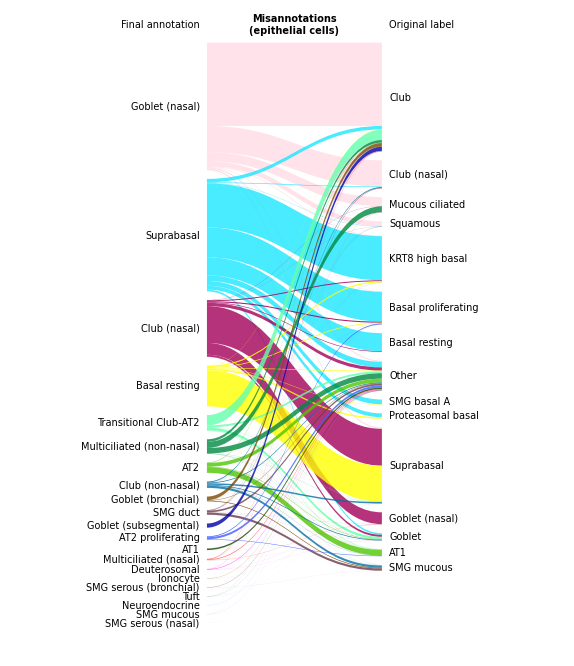

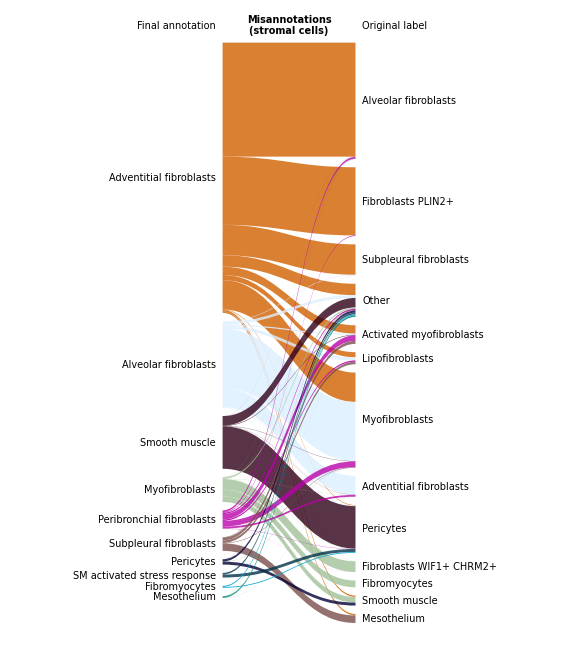

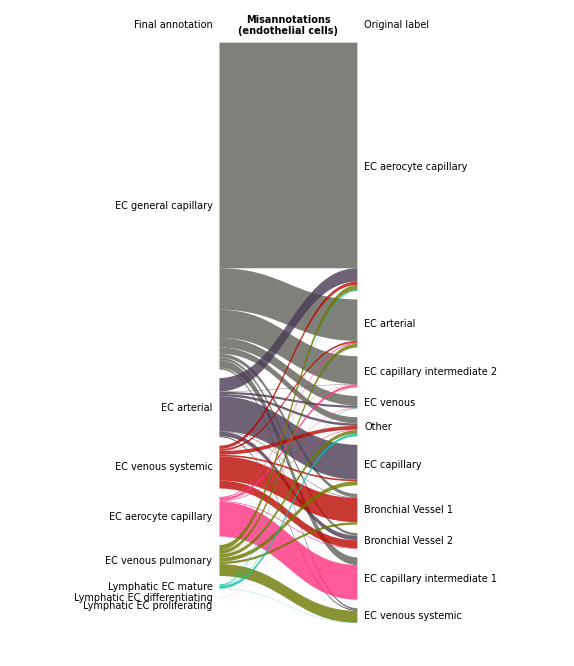

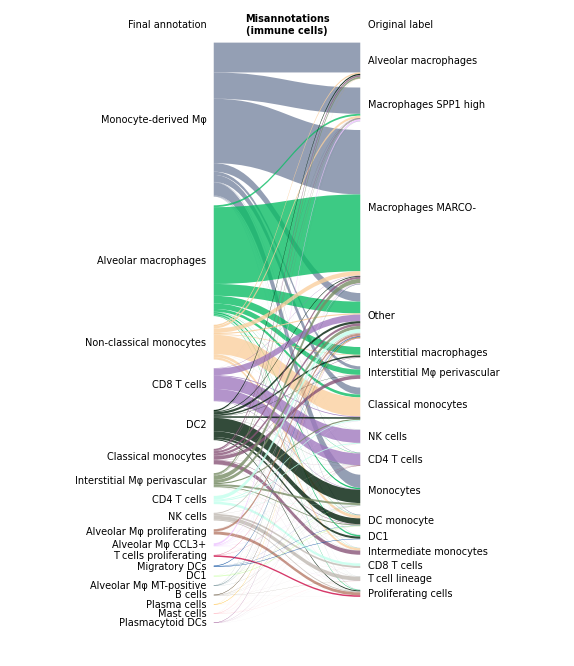

In [48]:
for comp in set(compartments):
    if comp == "Stroma":
        title = f"Misannotations\n({comp.lower()}l cells)"
    else:
        title = f"Misannotations\n({comp.lower()} cells)"
    fig, ax = plt.subplots(figsize=(5, 6))
    sankey.sankey(
        x=final_anns_per_comp[comp],
        y=original_anns_per_comp[comp],
        title=title,
        title_left="Final annotation",
        title_right="Original label",
        ax=ax,
        fontsize="5",
        colors={ct: col for ct, col in zip(ct_df.index, ct_df.colors)},
        colorside="left",
        alpha=0.8,
    )
    plt.show()
    plt.close()
    FIGURES[f"ED_4_final_vs_original_ann_mislabled_cells_{comp}"] = fig

### Extended Data Figure 5: Heatmaps of marker genes for each of the final cell type annotations.

We generated max 10 marker genes per cell type:

In [49]:
n_genes_per_ct = 10

Store the number of marker genes available per cell type (sometimes fewer than 10 genes passed filtering):

In [50]:
n_marker_genes_per_ct = {
    ct: np.sum(~pd.isnull(marker_genes[ct])) for ct in marker_genes.columns
}

As we don't want to plot a heatmap with hundreds of thousands of cells, we will take a random sample of subsample_n cells for every cell type. If a cell type has fewer than subsample_n cells, we will plot expression for all cells.

Calculate abundance for every cell type:

In [51]:
ct_abundance = adata.obs.manual_ann.value_counts().loc[cts]

Set number of cells to plot per cell type:

In [52]:
subsample_n = 750

Sample subsample_n barcodes for every cell type. Also, order annotations by "biological order" (based on hierarchical cell type reference):

In [53]:
# temporarily store barcode as column in adata.obs, so that we can use it for the groupby function below:
adata.obs["barcode"] = adata.obs.index
# order manual ann obs categories in adata according to ct order:
adata.obs.manual_ann.cat.reorder_categories(cts, inplace=True)
# groupby manual ann and sample subsample_n barcodes for each group (unless fewer are available)
sampled_cells = (
    adata.obs.groupby("manual_ann")["barcode"]
    .apply(lambda s: s.sample(min(len(s), subsample_n)))
    .droplevel(1, axis=0)
)
# drop barcode column
del adata.obs["barcode"]

Concatenate marker genes into a single list:

In [54]:
genes_to_plot_ordered = marker_genes.values.flatten(order="F")
# remove nas (for cell types that had fewer than n_genes_per_ct marker genes that passed filtering)
genes_to_plot_ordered = genes_to_plot_ordered[~pd.isnull(genes_to_plot_ordered)]

Get counts for marker genes, for cells to include, and put in a pandas dataframe:

In [55]:
subadata_counts = pd.DataFrame(
    adata[sampled_cells.values, genes_to_plot_ordered].X.toarray(),
    index=sampled_cells.values,
    columns=genes_to_plot_ordered,
)
subadata_manual_anns = sampled_cells.index

Normalize counts for every gene, such that for each gene, the 99.9th percentile among all cells in the HLCA is set to 1:

In [56]:
perc99 = np.percentile(subadata_counts, 99.9, axis=0)

In [57]:
subadata_counts_normalized = subadata_counts.div(perc99, axis=1)

Store color (according to consistent paper cell type coloring) and compartment (immune, epithelial, etc.) for every cell type:

In [58]:
manann2col = {ct: col for ct, col in zip(ct_df.index, ct_df.colors)}

In [59]:
manann2comp = {ct: comp for ct, comp in zip(ct_df.index, ct_df.Level_1)}

As some genes are markers for multiple cell types, and we only want to include genes once in the heatmap (does that make sense? consider leaving in...), remove duplicate columns:

In [60]:
subadata_counts_normalized_no_dupl = subadata_counts_normalized.loc[
    :, ~subadata_counts_normalized.columns.duplicated()
]

Now plot heatmaps showing expression of marker genes for the sampled cells. Plot one heatmap per compartment. Note that as this heatmap includes many cells, it takes quite a while to plot!

Immune
['B cells', 'Plasma cells', 'CD4 T cells', 'CD8 T cells', 'T cells proliferating', 'NK cells', 'DC1', 'DC2', 'Migratory DCs', 'Plasmacytoid DCs', 'Alveolar macrophages', 'Alveolar Mφ CCL3+', 'Alveolar Mφ MT-positive', 'Alveolar Mφ proliferating', 'Monocyte-derived Mφ', 'Interstitial Mφ perivascular', 'Classical monocytes', 'Non-classical monocytes', 'Mast cells']


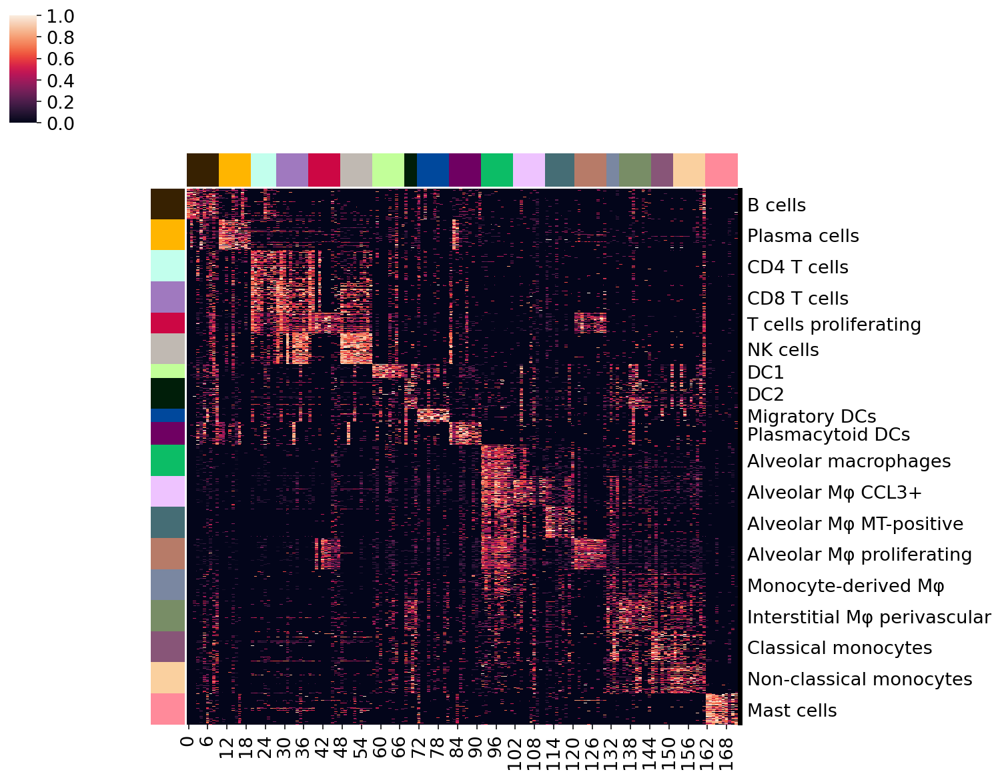

Epithelial
['Basal resting', 'Suprabasal', 'Deuterosomal', 'Multiciliated (nasal)', 'Multiciliated (non-nasal)', 'Club (non-nasal)', 'Club (nasal)', 'Goblet (nasal)', 'Goblet (bronchial)', 'Goblet (subsegmental)', 'Transitional Club-AT2', 'Ionocyte', 'Tuft', 'Neuroendocrine', 'SMG serous (nasal)', 'SMG serous (bronchial)', 'SMG mucous', 'SMG duct', 'AT1', 'AT2', 'AT2 proliferating']


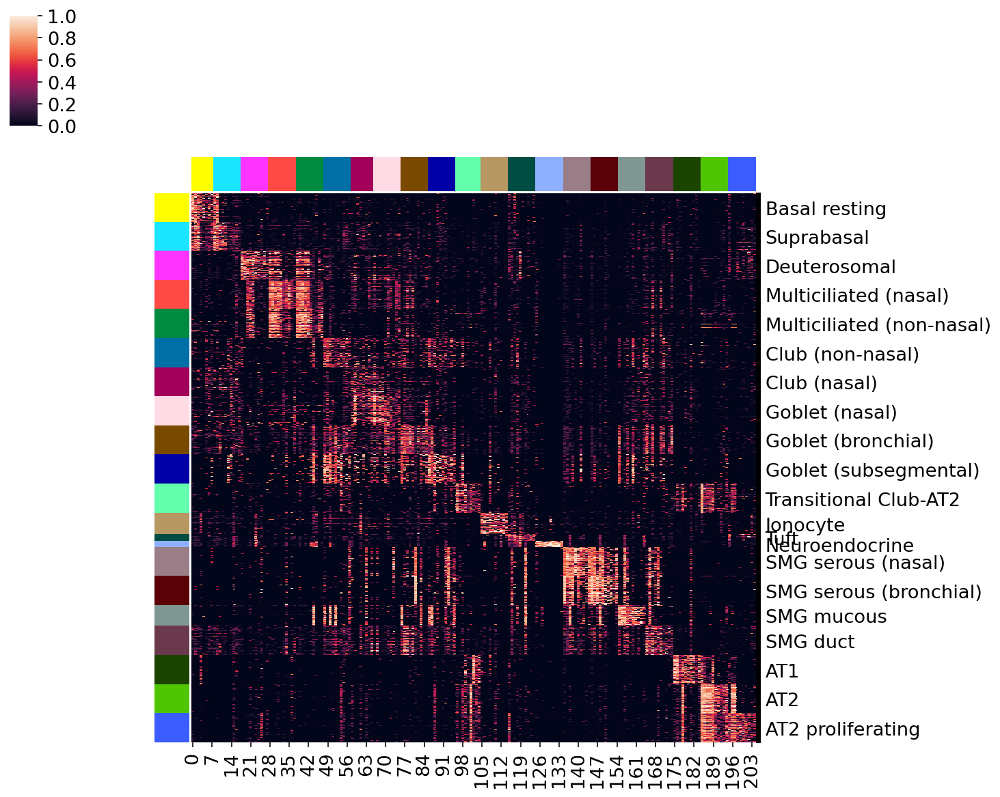

Endothelial
['EC arterial', 'EC aerocyte capillary', 'EC general capillary', 'EC venous systemic', 'EC venous pulmonary', 'Lymphatic EC mature', 'Lymphatic EC proliferating', 'Lymphatic EC differentiating']


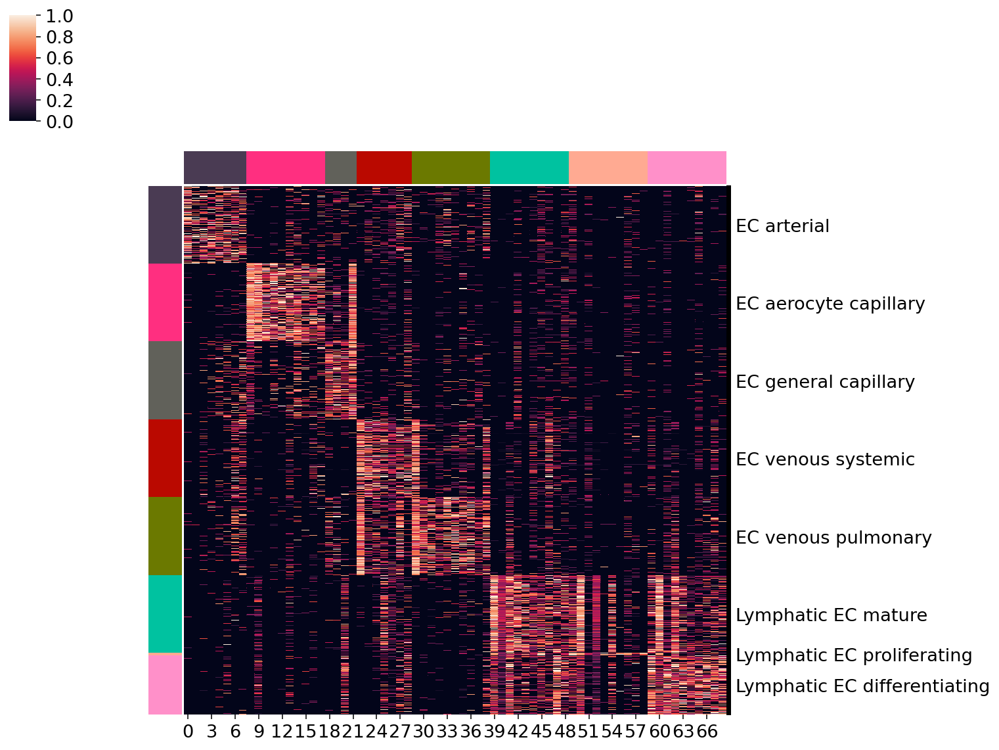

Stroma
['Peribronchial fibroblasts', 'Adventitial fibroblasts', 'Alveolar fibroblasts', 'Pericytes', 'Subpleural fibroblasts', 'Myofibroblasts', 'Smooth muscle', 'Fibromyocytes', 'SM activated stress response', 'Mesothelium']


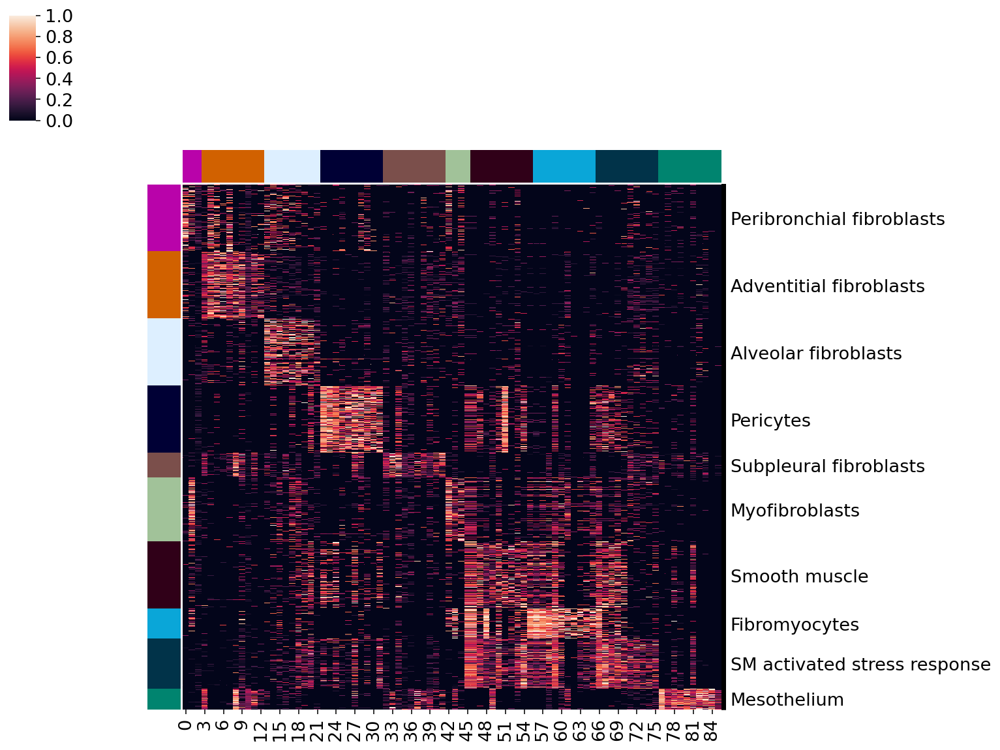

In [61]:
for comp in adata.obs.ann_level_1.unique():
    comp_cts = [ct for ct in cts if manann2comp[ct] == comp]
    comp_genes_to_plot_ordered = marker_genes.loc[:, comp_cts].values.flatten(order="F")
    comp_genes_to_plot_ordered = comp_genes_to_plot_ordered[
        ~pd.isnull(comp_genes_to_plot_ordered)
    ]
    print(comp)
    print(comp_cts)
    comp_sampled_cells = sampled_cells.loc[sampled_cells.index.isin(comp_cts)]
    comp_yticks = [""] * len(comp_sampled_cells)
    comp_col_cts = list()
    for ct in comp_cts:
        comp_col_cts += n_marker_genes_per_ct[ct] * [ct]
    count = 0
    for ct in comp_cts:
        ct_sample_count = min(subsample_n, ct_abundance[ct])
        ytick_loc = count + np.floor(ct_sample_count * 0.5)
        comp_yticks[int(ytick_loc)] = ct
        count += ct_sample_count
    comp_subadata_counts_normalized = subadata_counts_normalized_no_dupl.loc[
        comp_sampled_cells, comp_genes_to_plot_ordered
    ]
    fig_heatmap = sns.clustermap(
        data=comp_subadata_counts_normalized.values,
        row_cluster=False,
        col_cluster=False,
        row_colors=[manann2col[ct] for ct in comp_sampled_cells.index],
        vmin=0,
        vmax=1,
        col_colors=pd.Series(comp_col_cts).map(manann2col).tolist(),
        yticklabels=comp_yticks,
    )
    plt.setp(fig_heatmap.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
    FIGURES[f"ED5_heatmap_{comp}"] = fig_heatmap
    plt.show()
    plt.close()

We will now plot heatmaps for a single gene, with different font sizes, just to generate labels of different sizes, and that are right-aligned rather than left aligned (as above), that we can use for the figure in the paper. These heatmaps aren't for any other purpose. Note that they're automatically saved in a folder named "figures" in your current directory. (Couldn't figure out how to change that...)

/home/icb/lisa.sikkema/miniconda3/envs/scRNAseq_analysis/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'reannotation_type_summ' as categorical


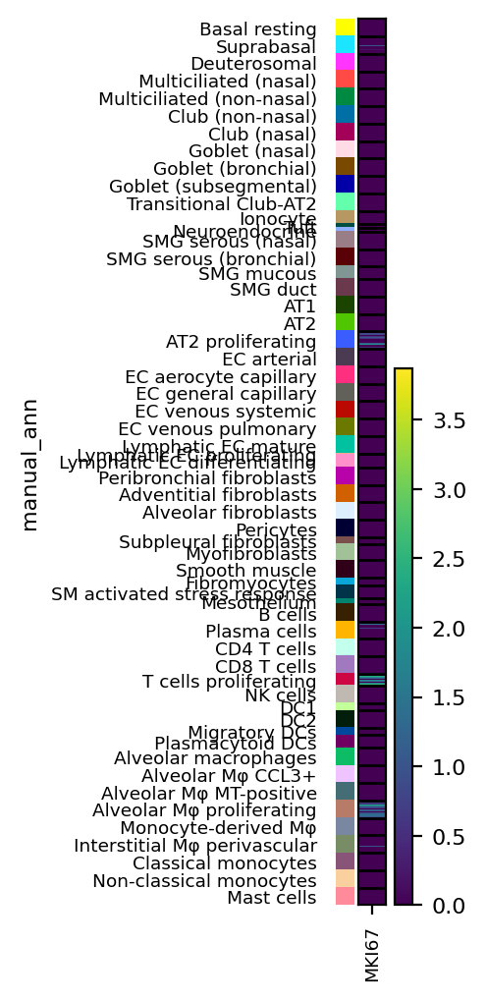

In [62]:
sc.set_figure_params(fontsize=8, figsize=(20, 2), dpi=200)
sc.pl.heatmap(
    adata[sampled_cells, :],
    var_names=["MKI67"],
    groupby="manual_ann",
    save="ED5_rightaligned_labels_bigfont.png",
)

Trying to set attribute `.obs` of view, copying.
... storing 'reannotation_type_summ' as categorical


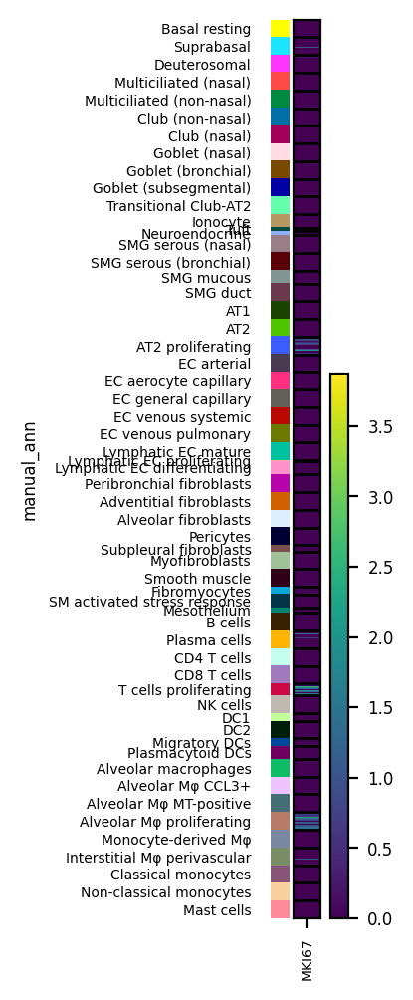

In [63]:
sc.set_figure_params(fontsize=6, figsize=(40, 4), dpi=200)
sc.pl.heatmap(
    adata[sampled_cells, :],
    var_names=["MKI67"],
    groupby="manual_ann",
    save="ED5_rightaligned_labels_mediumfont.png",
)

Trying to set attribute `.obs` of view, copying.
... storing 'reannotation_type_summ' as categorical


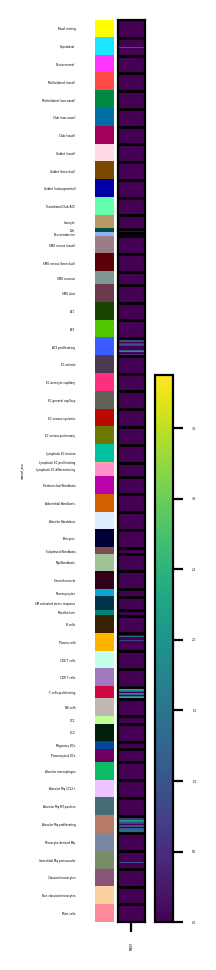

In [64]:
sc.set_figure_params(fontsize=1, figsize=(20, 2), dpi=200)
sc.pl.heatmap(
    adata[sampled_cells, :],
    var_names=["MKI67"],
    groupby="manual_ann",
    show=True,
    save="ED5_rightaligned_labels_smallfont.png",
)

## 3f, Extended Data Figure 6a: Rare cell analysis

First some basic stats on which datasets annotated their rare cells (i.e. neuro-endocrine, tuft cells, ionocytes). These stats are  mentioned in the paper.

In [65]:
rare_cells_per_ds = (
    adata.obs.groupby(["original_ann_level_4_clean", "dataset"])
    .agg({"original_ann_level_4_clean": "count"})
    .loc[["Neuroendocrine", "Ionocyte", "Tuft"], :]
).rename(
    columns={
        "original_ann_level_4_clean": "ncells_original",
    }
)
rare_cells_per_ds_final_ann = (
    adata.obs.groupby(["ann_level_4", "dataset"])
    .agg({"ann_level_4": "count"})
    .loc[["Neuroendocrine", "Ionocyte", "Tuft"], :]
).rename(
    columns={
        "ann_level_4": "ncells_final",
    }
)

In [66]:
rare_cells_per_ds["ncells_final"] = rare_cells_per_ds_final_ann.loc[
    rare_cells_per_ds.index, "ncells_final"
]

Number of datasets that originally labeled specific rare cells:

In [67]:
(rare_cells_per_ds.loc[:, ["ncells_original"]] > 0).groupby(
    "original_ann_level_4_clean"
).agg({"ncells_original": "sum"})

,ncells_original
original_ann_level_4_clean,
Ionocyte,7.0
Neuroendocrine,4.0
Tuft,2.0


Number of datasets with finally annotated rare cells:

In [68]:
(rare_cells_per_ds.loc[:, ["ncells_final"]] > 0).groupby(
    "original_ann_level_4_clean"
).agg({"ncells_final": "sum"})

,ncells_final
original_ann_level_4_clean,
Ionocyte,10.0
Neuroendocrine,9.0
Tuft,7.0


Now calculate precision (faction of cells in cluster that are labeled as cell type under consideration) and recall (percentage of cells labeled as cell type under consideration that are captured in the cluster) of "rare cell clusters". Also discussed in the text.

In [69]:
rare_cell_clusters = ["0.7.0", "0.7.1", "0.7.2"]

In [70]:
cluster_sizes = (
    adata.obs.groupby("leiden_3")
    .agg({"leiden_3": "count"})
    .rename(columns={"leiden_3": "n_cells"})
)
cluster_perc = cluster_sizes / cluster_sizes.sum() * 100
cluster_perc.rename(columns={"n_cells": "perc"}, inplace=True)

In [71]:
rare_cells_cluster_ass = (
    adata.obs.groupby(["original_ann_level_4_clean", "leiden_3"])
    .agg({"leiden_3": "count"})
    .rename(columns={"leiden_3": "n_cells"})
)

In [72]:
# neuroendocrine
rare_cell_recall = (
    rare_cells_cluster_ass.loc["Neuroendocrine"]
    .rename(columns={"n_cells": "n_ne"})
    .sort_values(by="n_ne", ascending=False)
)
rare_cell_recall["recall_ne"] = round(
    rare_cell_recall.n_ne / rare_cell_recall.n_ne.sum(), 3
)
rare_cell_recall["prec_ne"] = round(
    rare_cell_recall.n_ne / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)
# ionoctyes
rare_cell_recall["n_io"] = rare_cells_cluster_ass.loc["Ionocyte"].loc[
    rare_cell_recall.index
]
rare_cell_recall["recall_io"] = round(
    rare_cell_recall.n_io / rare_cell_recall.n_io.sum(), 3
)
rare_cell_recall["prec_io"] = round(
    rare_cell_recall.n_io / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)
# brush/tuft
rare_cell_recall["n_tuft"] = rare_cells_cluster_ass.loc["Tuft"].loc[
    rare_cell_recall.index
]
rare_cell_recall["recall_tuft"] = round(
    rare_cell_recall.n_tuft / rare_cell_recall.n_tuft.sum(), 3
)
rare_cell_recall["prec_tuft"] = round(
    rare_cell_recall.n_tuft / cluster_sizes.loc[rare_cell_recall.index, "n_cells"], 3
)

print percentage of total cells for rare cell clusters:

In [73]:
cluster_perc.loc[
    rare_cell_clusters,
]

,perc
leiden_3,
0.7.0,0.095916
0.7.1,0.028211
0.7.2,0.027185


print rare cell recall for same clusters:

In [74]:
rare_cell_recall.loc[rare_cell_clusters]

,n_ne,recall_ne,prec_ne,n_io,recall_io,prec_io,n_tuft,recall_tuft,prec_tuft
leiden_3,,,,,,,,,
0.7.0,0,0.000,0.000,367,0.783,0.654,7,0.081,0.012
0.7.1,0,0.000,0.000,7,0.015,0.042,65,0.756,0.394
0.7.2,98,0.961,0.616,10,0.021,0.063,2,0.023,0.013


Now split the rare cell clusters into "false positives" (cells annotated as rare or a subtype thereof but not in our rare cell clusters), "false negatives" (cells not annotated as rare or a subtype thereof, but in our rare cell clusters anyway) and "true positives" (cells annotated as rare or a subtype thereof, and also present in one of our rare cell clusters).

In [75]:
rare_adata = adata[adata.obs.leiden_3.isin(rare_cell_clusters), :].copy()
rare_false_pos_adata = adata[
    (
        ~adata.obs.leiden_3.isin(rare_cell_clusters)
        & adata.obs.original_ann_level_3.isin(["Rare"])
    ),
    :,
].copy()
rare_true_pos_adata = adata[
    (
        adata.obs.leiden_3.isin(rare_cell_clusters)
        & adata.obs.original_ann_level_3.isin(["Rare"])
    ),
    :,
].copy()
rare_false_neg_adata = adata[
    (
        adata.obs.leiden_3.isin(rare_cell_clusters)
        & ~adata.obs.original_ann_level_3.isin(["Rare"])
    ),
    :,
].copy()
# rename 3_Rare to Rare for figures
for ad in [rare_false_pos_adata, rare_true_pos_adata, rare_false_neg_adata]:
    ann_lev_4_mapper = {ct: ct for ct in ad.obs.original_ann_level_4}
    ann_lev_4_mapper["3_Rare"] = "Rare"
    ad.obs.original_ann_level_4 = ad.obs.original_ann_level_4.map(ann_lev_4_mapper)

sanity check (should be true)

In [76]:
rare_adata.n_obs == rare_false_neg_adata.n_obs + rare_true_pos_adata.n_obs

True

Set figure params:

In [77]:
sc.set_figure_params(dpi=140, figsize=(8, 8), fontsize=12)

Show overall marker expression (not shown in paper):

... storing 'reannotation_type_summ' as categorical


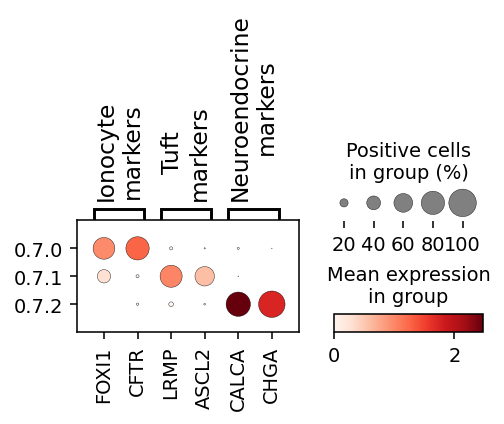

In [78]:
sc.pl.dotplot(
    rare_adata,
    var_names=[
        "FOXI1",
        "CFTR",
        "LRMP",
        "ASCL2",
        "CALCA",
        "CHGA",
    ],
    groupby="leiden_3",
    var_group_labels=[
        "Ionocyte\nmarkers",
        "Tuft\nmarkers",
        "Neuroendocrine\nmarkers",
        "Immune",
        "Stroma",
        "Endothelial",
    ],
    var_group_positions=[(0, 1), (2, 3), (4, 5)],
    show=True,
    size_title="Positive cells\nin group (%)",
)

Now plot dotplots per group:

In [79]:
FIGURES["ED6a_rare_cell_dotplot_false_positives"] = sc.pl.dotplot(
    rare_false_pos_adata,
    var_names=[
        "FOXI1",
        "CFTR",
        "LRMP",
        "ASCL2",
        "CALCA",
        "CHGA",
        "CD44",
        "LYZ",
        "SCGB1A1",
        "C20orf85",
        "KRT17",
    ],
    groupby="original_ann_level_4",
    categories_order=["Rare", "Ionocyte", "Tuft", "Neuroendocrine"],
    var_group_labels=[
        "Ionocyte",
        "Tuft",
        "Neuroendocrine",
        "Stromal",
        "SMG",
        "Secretory",
        "Cilliated",
        "Basal",
    ],
    var_group_positions=[
        (0, 1),
        (2, 3),
        (4, 5),
        (6, 6),
        (7, 7),
        (8, 8),
        (9, 9),
        (10, 10),
    ],
    return_fig=True,
    show=True,
    size_title="Positive cells\nin group (%)",
    vmax=2.2,
)

... storing 'reannotation_type_summ' as categorical


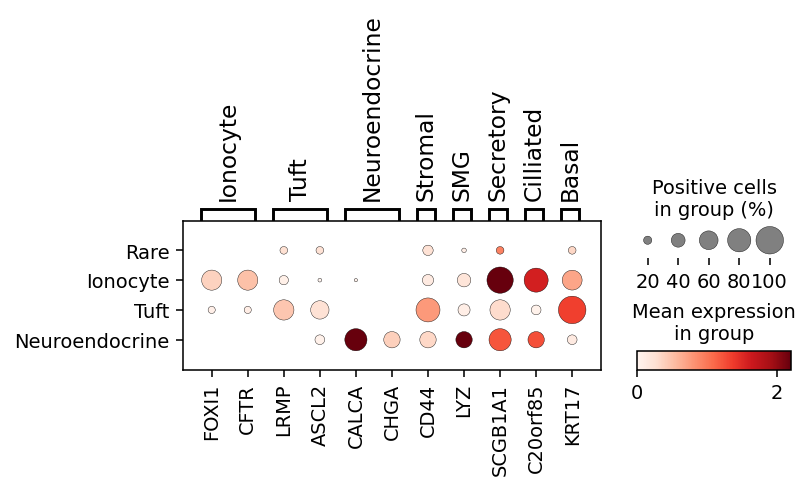

In [80]:
FIGURES["ED6a_rare_cell_dotplot_false_positives"].show()

In [81]:
FIGURES["ED6a_rare_cell_dotplot_false_negatives"] = sc.pl.dotplot(
    rare_false_neg_adata,
    var_names=[
        "FOXI1",
        "CFTR",
        "LRMP",
        "ASCL2",
        "CALCA",
        "CHGA",
        "CD44",
        "LYZ",
        "SCGB1A1",
        "C20orf85",
        "KRT17",
    ],
    groupby="leiden_3",
    var_group_labels=[
        "Ionocyte",
        "Tuft",
        "Neuroendocrine",
        "Stromal",
        "SMG",
        "Secretory",
        "Cilliated",
        "Basal",
    ],
    var_group_positions=[
        (0, 1),
        (2, 3),
        (4, 5),
        (6, 6),
        (7, 7),
        (8, 8),
        (9, 9),
        (10, 10),
    ],
    return_fig=True,
    show=True,
    size_title="Positive cells\nin group (%)",
    vmax=2.2,
)

... storing 'reannotation_type_summ' as categorical


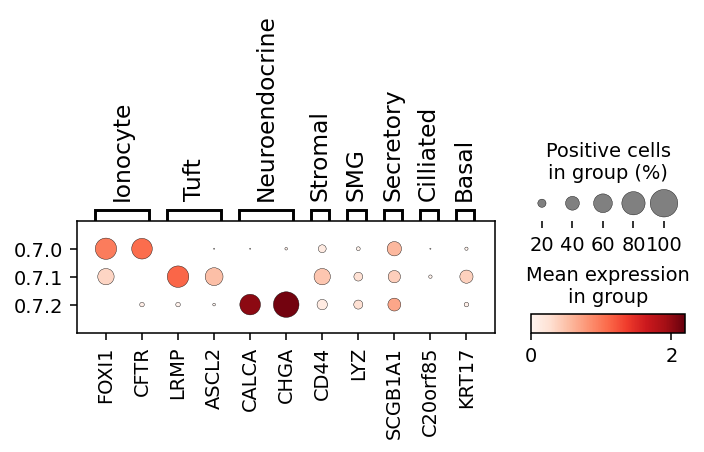

In [82]:
FIGURES["ED6a_rare_cell_dotplot_false_negatives"].show()

In [83]:
FIGURES["ED6a_rare_cell_dotplot_true_positives"] = sc.pl.dotplot(
    rare_true_pos_adata,
    var_names=[
        "FOXI1",
        "CFTR",
        "LRMP",
        "ASCL2",
        "CALCA",
        "CHGA",
        "CD44",
        "LYZ",
        "SCGB1A1",
        "C20orf85",
        "KRT17",
    ],
    groupby="leiden_3",
    var_group_labels=[
        "Ionocyte",
        "Tuft",
        "Neuroendocrine",
        "Stromal",
        "SMG",
        "Secretory",
        "Cilliated",
        "Basal",
    ],
    var_group_positions=[
        (0, 1),
        (2, 3),
        (4, 5),
        (6, 6),
        (7, 7),
        (8, 8),
        (9, 9),
        (10, 10),
    ],
    return_fig=True,
    show=True,
    size_title="Positive cells\nin group (%)",
    vmax=2.2,
)

... storing 'reannotation_type_summ' as categorical


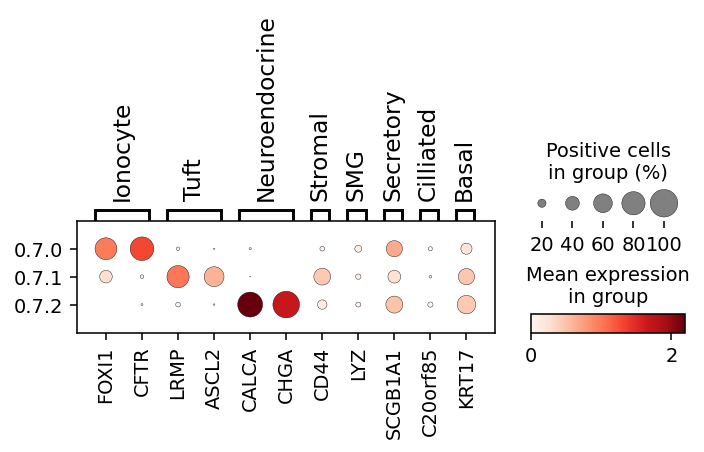

In [84]:
FIGURES["ED6a_rare_cell_dotplot_true_positives"].show()

Now prepare the umaps from figure 3f:

We'll clean up labels, setting all cell types with fewer than min_perc% of cells among the rare cell clusters to "Other", for legibility of figure.

In [85]:
min_perc = 2  # minimum percentage of cells with label for label to be kept

In [86]:
original_annotation_counts = rare_adata.obs.original_ann_level_4.value_counts()

In [87]:
original_annotations_to_keep = [
    ct
    for ct, count in zip(
        original_annotation_counts.index, original_annotation_counts.values
    )
    if count / rare_adata.n_obs * 100 > min_perc
]

In [88]:
rare_ann_mapping = {ct: "Other" for ct in original_annotation_counts.index}
for ct in original_annotations_to_keep:
    if ct[1] == "_":
        ct_new = ct[2:]
    else:
        ct_new = ct
    rare_ann_mapping[ct] = ct_new
rare_adata.obs[
    "original_ann_level_4_clean_fig"
] = rare_adata.obs.original_ann_level_4.map(rare_ann_mapping)

Check which labels are not set to "Other":

In [89]:
original_annotations_to_keep

['Ionocyte', '3_Rare', 'Neuroendocrine', 'Tuft', 'Transitional AT2']

Re-calculate neighbor graph and umap (make sure to use integrated embedding as basis for graph):

In [90]:
sc.pp.neighbors(rare_adata, n_neighbors=15, use_rep="X_scanvi_emb")

In [91]:
sc.tl.umap(rare_adata)

In [92]:
markers = [
    "FOXI1",
    "LRMP",
    "CALCA",
]

set figure parameters:

In [93]:
sc.set_figure_params(dpi=140, figsize=(3, 3.5))

... storing 'original_ann_level_4_clean_fig' as categorical


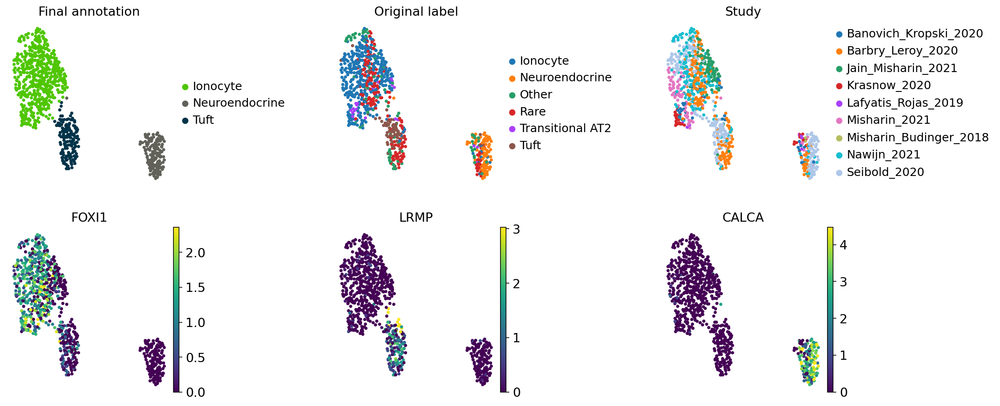

In [94]:
FIGURES["3f_rare_cell_umaps"] = sc.pl.umap(
    rare_adata,
    color=["ann_level_4", "original_ann_level_4_clean_fig", "study"] + markers,
    ncols=3,
    sort_order=False,
    wspace=0.8,
    vmax="p99",
    frameon=False,
    size=50,
    title=["Final annotation", "Original label", "Study"] + markers,
    return_fig=True,
)

## 3g, Extended Data figure 6c, Migratory DC analysis:

Here we'll take a look at migratory DCs, a relatively rare cell type that was not annotated in most of the datasets, but which we detected using the integration in many datasets. Here we'll show marker expression to confirm that they are actually migratory DCs.

subset adata to DCs (cluster 1.2.1) and re-embed:

In [95]:
dc_adata = adata[adata.obs.leiden_3.isin(["1.2.1"]), :].copy()

Now extract mDC clusters from larger leiden_3 cluster, and re-embed:

In [96]:
mdc_adata = adata[adata.obs.leiden_5.isin(["1.2.1.2.1", "1.2.1.2.2"]), :].copy()

check how cells from mdc clusters were annotated, and how specific those annotations were:

In [97]:
mdc_per_study_ann = pd.crosstab(mdc_adata.obs.original_ann_level_4, mdc_adata.obs.study)
dc_per_study_ann = pd.crosstab(dc_adata.obs.original_ann_level_4, dc_adata.obs.study)

In [98]:
mdc_per_study_ann

study,Banovich_Kropski_2020,Barbry_Leroy_2020,Jain_Misharin_2021,Krasnow_2020,Lafyatis_Rojas_2019,Meyer_2019,Misharin_2021,Misharin_Budinger_2018,Nawijn_2021,Teichmann_Meyer_2019
original_ann_level_4,,,,,,,,,,
2_Lymphoid,0,0,0,0,0,0,0,0,0,2
2_Myeloid,0,0,8,0,0,0,0,0,0,0
3_Dendritic cells,0,8,0,0,21,0,0,6,0,29
3_Macrophages,0,0,0,0,0,0,9,0,0,0
3_Monocytes,0,5,0,0,0,0,0,0,13,0
Alveolar macrophages,0,0,0,1,0,1,0,0,0,0
B cells,8,0,0,0,0,0,0,0,0,0
DC1,34,0,0,37,0,1,0,0,0,0
DC2,2,0,0,0,0,2,6,0,0,0


perc. of mdcs in atlas:

In [99]:
mdc_adata.n_obs / adata.n_obs * 100

0.05334391092934668

number of  mdcs per study:

In [100]:
mdc_n_by_study = mdc_adata.obs.study.value_counts()

In [101]:
mdc_n_by_study

Banovich_Kropski_2020     89
Meyer_2019                78
Krasnow_2020              38
Teichmann_Meyer_2019      31
Lafyatis_Rojas_2019       21
Misharin_2021             15
Nawijn_2021               13
Barbry_Leroy_2020         13
Jain_Misharin_2021         8
Misharin_Budinger_2018     6
Name: study, dtype: int64

show marker expression in mdcs compared to other dcs. Label by cell type + study, and number of migratory dcs for mdc labels.

In [102]:
dc_adata.obs["mdc"] = "Other DC"
dc_adata.obs.loc[dc_adata.obs.index.isin(mdc_adata.obs.index), "mdc"] = "Migratory DC"
dc_adata.obs["mdc_by_study"] = [
    f"{mdc} ({study}, n={mdc_n_by_study[study]})"
    if mdc == "Migratory DC"
    else f"{mdc} ({study}"
    for mdc, study in zip(dc_adata.obs.mdc, dc_adata.obs.study)
]

Set colors and figure parameters:

In [103]:
custom_palette_1 = {"Migratory DC": "maroon", "Other DC": "grey"}

In [104]:
sc.set_figure_params(figsize=(4, 3), frameon=False, transparent=True, fontsize=20)

In [105]:
sns.set_style("white")

Now plot ccr7 expression. Note that this figure is automatically saved in a "figures" folder in your current directory (couldn't figure out how to change that...)

... storing 'reannotation_type_summ' as categorical
... storing 'mdc' as categorical
... storing 'mdc_by_study' as categorical


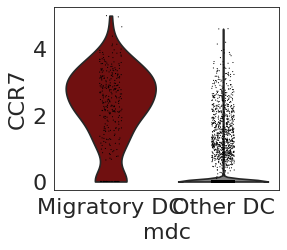

In [106]:
sc.pl.violin(
    dc_adata,
    keys=["CCR7"],
    groupby="mdc",
    return_fig=True,
    show=True,
    vmax=2.2,
    palette=custom_palette_1,
    save="3g_migratory_DCs_CCR7_violin.png",
)

Clean up mdc_by_study labels to look pretty (starting Migratory DC labels with a space, so that they're plotted next to one another):

In [107]:
mdc_by_study_relabeling = {
    old_name: old_name.replace("Migratory DC", "")
    .replace("Other DC ", "")
    .replace("(", "")
    .replace(")", "")
    for old_name in dc_adata.obs.mdc_by_study.unique()
}

In [108]:
dc_adata.obs["mdc_by_study_pretty_labels"] = dc_adata.obs.mdc_by_study.map(
    mdc_by_study_relabeling
)

set colors to red for all mdcs, and to grey for all other dcs. Set figure parameters.

In [109]:
custom_palette_2 = {
    (study): ("maroon" if study.startswith(" ") else "grey")
    for study in dc_adata.obs.mdc_by_study_pretty_labels.unique()
}

In [110]:
sc.set_figure_params(figsize=(8, 3), frameon=False, transparent=True, fontsize=14)

Now generate violin plot showing marker expression split by study. Note that this figure is automatically saved in a "figures" folder in your current directory (couldn't figure out how to change that...)

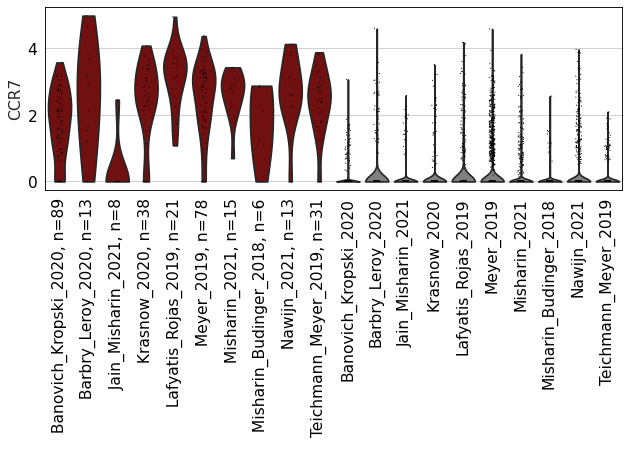

In [111]:
sc.pl.violin(
    dc_adata,
    keys=[
        "CCR7"
    ],  # "CCL22", "BIRC3"], # other markers work but couldn't find references
    groupby="mdc_by_study_pretty_labels",
    return_fig=True,
    show=True,
    vmax=2.2,
    palette=custom_palette_2,
    rotation=90,
    save="ED6c_migratory_DCs_by_study_CCR7_violin.png",
)

## Extra (not included in paper but nice anyway):Study and subject composition per cell type:

Calculate percentage of cells from each study, for each cell type:

In [112]:
studies_per_ct = pd.crosstab(adata.obs.manual_ann, adata.obs.study)
studies_per_ct_norm = studies_per_ct.divide(studies_per_ct.sum(axis=1), axis=0) * 100

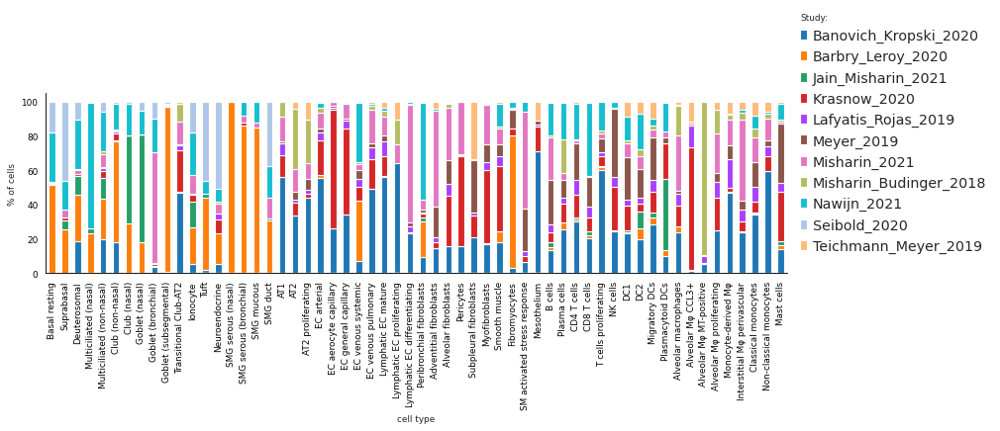

In [113]:
fz = 8
with plt.rc_context(
    {
        "figure.figsize": (12, 3),
        "xtick.labelsize": fz,
        "ytick.labelsize": fz,
        "axes.labelsize": fz,
        "font.size": fz,
        "axes.spines.right": False,
        "axes.spines.top": False,
    }
):
    fig, ax = plt.subplots()
    studies_per_ct_norm.plot(kind="bar", stacked=True, ax=ax)
    plt.grid(False)
    plt.ylabel("% of cells")
    plt.xlabel("cell type")
    leg = plt.legend(loc=(1.01, 0.08), frameon=False, title="Study:")
    leg._legend_box.align = "left"
    plt.show()
    plt.close()

For subjects, do the same. But as we cannot color each subject with a visibly distinct color (>100 subjects), we will rank them per cell type and color by rank. The most common subject in a single cell type will therefore always be named "1", etc.. Subject 1 for cell type A will therefore be different from subject 1 from cell type B. This plot will give you an impression of subject "diversity" per cell type.

In [114]:
# calculate percentages contributed per subject for every cell type
subjects_per_ct = pd.crosstab(adata.obs.manual_ann, adata.obs.subject_ID)
subjects_per_ct_norm = subjects_per_ct.divide(subjects_per_ct.sum(axis=1), axis=0) * 100

In [115]:
# create dataframe in which we will store the top 10 subject percentages
subjects_per_ct_top10subjects = pd.DataFrame(
    index=subjects_per_ct_norm.index, columns=range(1, 11)
)
# fill in dataframe with top 10 percentages
for ct in subjects_per_ct_top10subjects.index:
    subjects_per_ct_top10subjects.loc[ct,] = (
        subjects_per_ct_norm.loc[
            ct,
        ]
        .sort_values(ascending=False)[:10]
        .values
    )
# add a final column with "other subjects"
subjects_per_ct_top10subjects["other"] = 100 - subjects_per_ct_top10subjects.sum(axis=1)

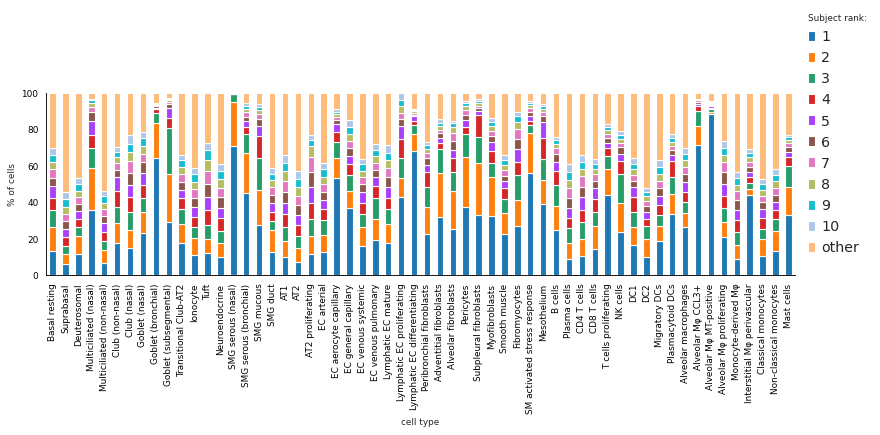

In [116]:
fz = 8
with plt.rc_context(
    {
        "figure.figsize": (12, 3),
        "xtick.labelsize": fz,
        "ytick.labelsize": fz,
        "axes.labelsize": fz,
        "font.size": fz,
        "axes.spines.right": False,
        "axes.spines.top": False,
    }
):
    fig, ax = plt.subplots()
    subjects_per_ct_top10subjects.plot(kind="bar", stacked=True, ax=ax)
    plt.grid(False)
    plt.ylabel("% of cells")
    plt.xlabel("cell type")
    leg = plt.legend(loc=(1.01, 0.08), frameon=False, title="Subject rank:")
    leg._legend_box.align = "left"
    plt.show()

# Store figures:

Store:

In [117]:
# for figname, fig in FIGURES.items():
#     print("Storing", figname)
#     fig.savefig(
#         os.path.join(dir_figures, f"{figname}.png"), bbox_inches="tight", dpi=140, transparent=True
#     )
#     plt.close()

Or store a single figure:

In [118]:
# figname = "2c_per_subject_heatmap"
# FIGURES[figname].savefig(
#     os.path.join(dir_figures, f"{figname}.png"),
#     bbox_inches="tight",
#     dpi=140,
#     transparent=True,
# )
# plt.close()